# Insurance Claims- Fraud Detection :- Evaluation_Project_9

### Submitted by: Vinayak Patil

### Problem Statement:

### Business case:
    
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.

Note: Use the link below to reach to your dataset. Downlaod Files: https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv

### Importing Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing  import power_transform, StandardScaler, LabelEncoder
from sklearn.feature_selection import VarianceThreshold, SelectKBest, f_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.metrics import roc_curve, auc, roc_auc_score,plot_roc_curve, accuracy_score,classification_report, confusion_matrix
from sklearn.ensemble import  RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
import pickle
import warnings
warnings.filterwarnings('ignore')

### Importing the DATASET

In [3]:
fraud=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv")

### Checking Top 5 rows Data

In [4]:
fraud.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


# EDA

### Checking Total Numbers of Rows and Column

In [5]:
fraud.shape

(1000, 40)

### Checking All Column Names

In [6]:
fraud.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

### Checking Data Type of All Data

In [7]:
fraud.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

### Checking for Null Values

In [8]:
fraud.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

#### Observations:

We can see Null Value is present in only one column : _c39

### Information about Data (Memory Used and Data Types)

In [9]:
fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

### Checking for ? values if present in our dataset or not

In [10]:
(fraud=='?').sum()

months_as_customer               0
age                              0
policy_number                    0
policy_bind_date                 0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries     

#### Observations:

We can see 0 values are present in our 3 columns of our dataset: collision_type, property_damage & police_report_available. We will handle it.

In [11]:
#converrting ? values to Null Value, so that we can handle it.
fraud.replace({'?': np.nan}, inplace=True)

In [12]:
#checking again null Values in Dataset
fraud.isnull().sum()


months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

#### Observations:

So, now we can see Null Values are present in 4 columns: collision_type, property_damage, police_report_available & _c39

### Checking whether the dataset contains any space

In [13]:
fraud[fraud['fraud_reported'] == '']

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39


#### Observations:

So we can see there are no spaces present in the dataset.

### Checking for blank value in our Target Column

In [14]:
fraud[fraud['fraud_reported'] == ''].index

Int64Index([], dtype='int64')

#### Observations:

So, we can check there are no blank value present in our Target Column

### Checking values of Target Variable.

In [15]:
fraud['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

### Checking unique values present in the Target Variable.

In [16]:
fraud['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [17]:
fraud['fraud_reported'].nunique()

2

### Checking unique elements of each columns

In [18]:
fraud.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

### Descriptive Statistics

In [19]:
# Description of Dataset : works only on continuous column 
fraud.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


#### Observations:

So, we can see that 19 column is containing continuous data and rest 21 column contains categorical data.

### Checking Description through heatmap also.

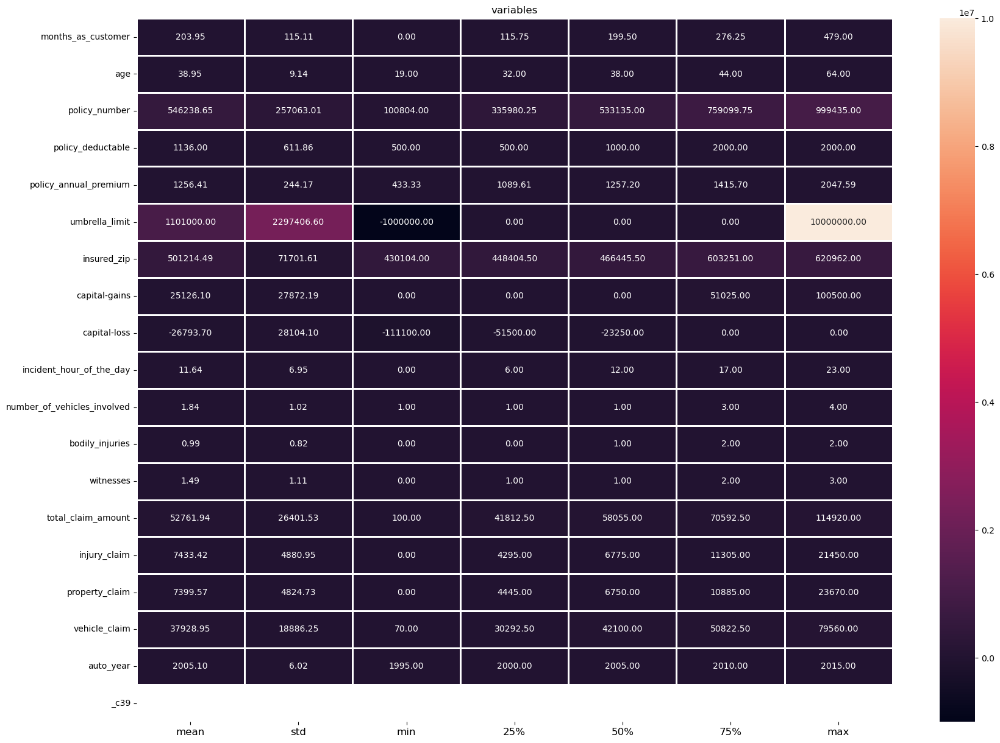

In [20]:
plt.figure(figsize=(20,15))
sns.heatmap(round(fraud.describe()[1:].transpose(),2),linewidth=2,annot=True,fmt='.2f')
plt.xticks(fontsize=18)
plt.xticks(fontsize=12)
plt.title('variables')
plt.show()

#### Observations:

1. The summary of this dataset looks not good as there are negative/ invalid value present.
2. Total No of Rows: 1000 and Total No. of Columns: 40
3. Column containing Null value is : _c39 and we can see there are only null value in this column so we will drop this column
4. We can see values of min, 25%, 50% , 75% & max values are not good, showing 0 of columns: umbrella_limit, capital-gains, capital-loss, injury_claim & property_claim.

### Data Cleaning and preprocessing

Since there are Null values in the dataset, so we need to treat them.

In [21]:
fraud['_c39'].value_counts()

Series([], Name: _c39, dtype: int64)

In [22]:
fraud['_c39'].unique()

array([nan])

In [23]:
#Droping "_c39" column from dataset because this column contains only null value/data. So it have no relation with our Target Column. 
fraud=fraud.drop(columns="_c39", axis=1)

### Checking values of column 'collision_type'

In [24]:
fraud['collision_type'].unique()

array(['Side Collision', nan, 'Rear Collision', 'Front Collision'],
      dtype=object)

In [25]:
#checking repeated values in "collision_type" column through mode
print( fraud["collision_type"].mode())

0    Rear Collision
Name: collision_type, dtype: object


In [26]:
#Filling Null Values of "collision_type" column in dataset by mode value
fraud["collision_type"].fillna(fraud["collision_type"].mode(), inplace=True)

### Checking values of column 'property_damage'

In [27]:
fraud['property_damage'].unique()

array(['YES', nan, 'NO'], dtype=object)

In [28]:
#checking repeated values in "property_damage" column through mode
print( fraud["property_damage"].mode())

0    NO
Name: property_damage, dtype: object


In [29]:
#Filling Null Values of "property_damage" column in dataset by mode value
fraud["property_damage"].fillna(fraud["property_damage"].mode(), inplace=True)

### Checking values of column 'police_report_available'

In [30]:
fraud['police_report_available'].unique()

array(['YES', nan, 'NO'], dtype=object)

In [31]:
#checking repeated values in "police_report_available" column through mode
print( fraud["police_report_available"].mode())

0    NO
Name: police_report_available, dtype: object


In [32]:
#Filling Null Values of "police_report_available" column in dataset by mode value
fraud["police_report_available"].fillna(fraud["police_report_available"].mode(), inplace=True)

### Checking values of column 'umbrella_limit'

In [33]:
fraud['umbrella_limit'].value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

#### Observations:

We can see column 'umbrella_limit' contains 0 value more. So, we will replace 0 values with mean value.

In [34]:
#checking mean value of column 'umbrella_limit'
print(fraud['umbrella_limit'].mean())    

1101000.0


In [35]:
#replacing 0 values of column 'umbrella_limit' with mean value "1101000.0"
fraud['umbrella_limit'] = fraud['umbrella_limit'].replace(0, 1101000.0)    

In [36]:
#checking again all values of column 'umbrella_limit'
fraud['umbrella_limit'].value_counts()

 1101000     798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

### Checking values of column 'capital-gains'

In [37]:
fraud['capital-gains'].value_counts()

0        508
46300      5
51500      4
68500      4
55600      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: capital-gains, Length: 338, dtype: int64

#### Observations:

We can see column 'capital-gains' contains 0 value more. So, we will replace 0 values with mean value.

In [38]:
#checking mean value of column 'capital-gains'
print(fraud['capital-gains'].mean())  

25126.1


In [39]:
#replacing 0 values of column 'capital-gains' with mean value "25126.1"
fraud['capital-gains'] = fraud['capital-gains'].replace(0, 25126.1)  

In [40]:
#checking again all value
fraud['capital-gains'].value_counts()

25126.1    508
46300.0      5
51500.0      4
68500.0      4
55600.0      3
          ... 
36700.0      1
54900.0      1
69200.0      1
48800.0      1
50300.0      1
Name: capital-gains, Length: 338, dtype: int64

### Checking values of column 'capital-loss'

In [41]:
fraud['capital-loss'].value_counts()

 0        475
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700      1
-82100      1
Name: capital-loss, Length: 354, dtype: int64

#### Observations:

We can see column 'capital-loss' contains 0 value more. So, we will replace 0 values with mean value.

In [42]:
#checking mean value of column 'capital-loss'
print(fraud['capital-loss'].mean())  

-26793.7


In [43]:
#replacing 0 values of column 'capital-loss' with mean value "-26793.7"
fraud['capital-loss'] = fraud['capital-loss'].replace(0, -26793.7)   

In [44]:
#checking again all values
fraud['capital-loss'].value_counts()

-26793.7    475
-31700.0      5
-53700.0      5
-50300.0      5
-45300.0      4
           ... 
-12100.0      1
-17000.0      1
-72900.0      1
-19700.0      1
-82100.0      1
Name: capital-loss, Length: 354, dtype: int64

### Checking values of column 'injury_claim'

In [45]:
fraud['injury_claim'].value_counts()

0        25
640       7
480       7
660       5
580       5
         ..
14840     1
6580      1
11820     1
16650     1
7500      1
Name: injury_claim, Length: 638, dtype: int64

#### Observations:

We can see column 'injury_claim' contains 0 value more. So, we will replace 0 values with mean value.

In [46]:
#checking mean value of column 'injury_claim'
print(fraud['injury_claim'].mean())  

7433.42


In [47]:
#replacing 0 values of column 'injury_claim' with mean value "7433.42"
fraud['injury_claim'] = fraud['injury_claim'].replace(0, 7433.42)   

In [48]:
#checking again all value
fraud['injury_claim'].value_counts()

7433.42     25
640.00       7
480.00       7
660.00       5
580.00       5
            ..
14840.00     1
6580.00      1
11820.00     1
16650.00     1
7500.00      1
Name: injury_claim, Length: 638, dtype: int64

### Checking values of column 'property_claim'

In [49]:
fraud['property_claim'].value_counts()

0        19
860       6
480       5
660       5
10000     5
         ..
3590      1
6480      1
4580      1
4920      1
7500      1
Name: property_claim, Length: 626, dtype: int64

#### Observations:

We can see column 'property_claim' contains 0 value more. So, we will replace 0 values with mean value.

In [50]:
#checking mean value of column 'umbrella_limit'
print(fraud['property_claim'].mean())  

7399.57


In [51]:
#replacing 0 values of column 'property_claim' with mean value "7399.57"
fraud['property_claim'] = fraud['property_claim'].replace(0, 7399.57)   

In [52]:
#checking again all values
fraud['property_claim'].value_counts()

7399.57     19
860.00       6
480.00       5
660.00       5
10000.00     5
            ..
3590.00      1
6480.00      1
4580.00      1
4920.00      1
7500.00      1
Name: property_claim, Length: 626, dtype: int64

In [53]:
print(fraud["policy_bind_date"].value_counts())

01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64


### Extracting 'year' from policy_bind_date

In [54]:
#converting datatype from object to datetime 
fraud['policy_bind_date']=pd.to_datetime(fraud['policy_bind_date'])

In [55]:
#mapping year values from 'policy_bind_date' to 'Policy_Bind_Year' column in main dataframe
fraud['Policy_Bind_Year']=fraud['policy_bind_date'].apply(lambda y:y.year)

In [56]:
fraud.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', 'Policy_Bind_Year'],
      dtype='object')

In [57]:
#dropping 'policy_bind_date' column as we have now no need of it.
fraud.drop(columns = ['policy_bind_date'],inplace = True)

In [58]:
fraud.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Year
0,328,48,521585,OH,250/500,1000,1406.91,1101000,466132,MALE,...,YES,71610,6510.0,13020.0,52080,Saab,92x,2004,Y,2014
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,...,NaN,5070,780.0,780.0,3510,Mercedes,E400,2007,Y,2006
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,NO,34650,7700.0,3850.0,23100,Dodge,RAM,2007,N,2000
3,256,41,227811,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,NO,63400,6340.0,6340.0,50720,Chevrolet,Tahoe,2014,Y,1990
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,NO,6500,1300.0,650.0,4550,Accura,RSX,2009,N,2014


### Extracting 'Age' of policy bind from Policy_Bind_Year

In [59]:
fraud['Policy_Bind_Age'] = fraud['Policy_Bind_Year'].apply(lambda y: 2016 - y)

In [60]:
fraud.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', 'Policy_Bind_Year',
       'Policy_Bind_Age'],
      dtype='object')

In [61]:
#dropping 'Policy_Bind_Year' column as we have now no need of it.
fraud.drop(columns = ['Policy_Bind_Year'],inplace = True)

In [62]:
#checking again null values
fraud.isnull().sum()

months_as_customer               0
age                              0
policy_number                    0
policy_state                     0
policy_csl                       0
policy_deductable                0
policy_annual_premium            0
umbrella_limit                   0
insured_zip                      0
insured_sex                      0
insured_education_level          0
insured_occupation               0
insured_hobbies                  0
insured_relationship             0
capital-gains                    0
capital-loss                     0
incident_date                    0
incident_type                    0
collision_type                 178
incident_severity                0
authorities_contacted            0
incident_state                   0
incident_city                    0
incident_location                0
incident_hour_of_the_day         0
number_of_vehicles_involved      0
property_damage                360
bodily_injuries                  0
witnesses           

In [63]:
fraud.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Age
0,328,48,521585,OH,250/500,1000,1406.91,1101000,466132,MALE,...,YES,71610,6510.0,13020.0,52080,Saab,92x,2004,Y,2
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,...,NaN,5070,780.0,780.0,3510,Mercedes,E400,2007,Y,10
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,NO,34650,7700.0,3850.0,23100,Dodge,RAM,2007,N,16
3,256,41,227811,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,NO,63400,6340.0,6340.0,50720,Chevrolet,Tahoe,2014,Y,26
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,NO,6500,1300.0,650.0,4550,Accura,RSX,2009,N,2


### Extracting Incident Month from incident_date

In [64]:
#converting Datatype from object to Datetime
fraud['incident_date']=pd.to_datetime(fraud['incident_date'])

In [65]:
fraud['Incident_Month'] = fraud['incident_date'].apply(lambda m:m.month)

In [66]:
#we will dropm column "incident_date" after extracting month
fraud.drop(columns=['incident_date'],inplace=True)

In [67]:
fraud.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Age,Incident_Month
0,328,48,521585,OH,250/500,1000,1406.91,1101000,466132,MALE,...,71610,6510.0,13020.0,52080,Saab,92x,2004,Y,2,1
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,...,5070,780.0,780.0,3510,Mercedes,E400,2007,Y,10,1
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,34650,7700.0,3850.0,23100,Dodge,RAM,2007,N,16,2
3,256,41,227811,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,63400,6340.0,6340.0,50720,Chevrolet,Tahoe,2014,Y,26,10
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,6500,1300.0,650.0,4550,Accura,RSX,2009,N,2,2


In [68]:
fraud.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                  float64
capital-loss                   float64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage          

In [69]:
#checking again all column names
fraud.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', 'Policy_Bind_Age',
       'Incident_Month'],
      dtype='object')

In [70]:
#Checking again total Rows and Columns
fraud.shape

(1000, 39)

# Data Visualization

### Univariate Analysis

### Using Countplot for categorical columns

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


<AxesSubplot:xlabel='policy_state', ylabel='count'>

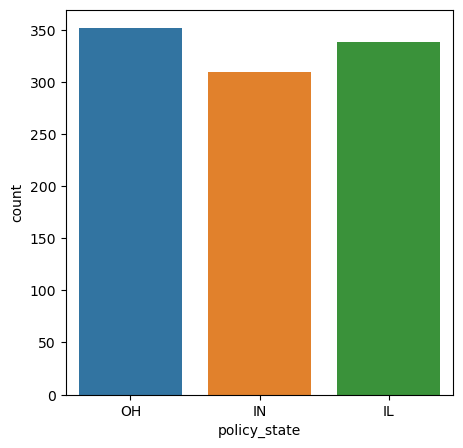

In [71]:
#Count Plot for "policy_state" column
print(fraud["policy_state"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("policy_state",data=fraud)

#### Observations:

policy_state of OH is more compare to other policy_state: IL & IN

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


<AxesSubplot:xlabel='policy_csl', ylabel='count'>

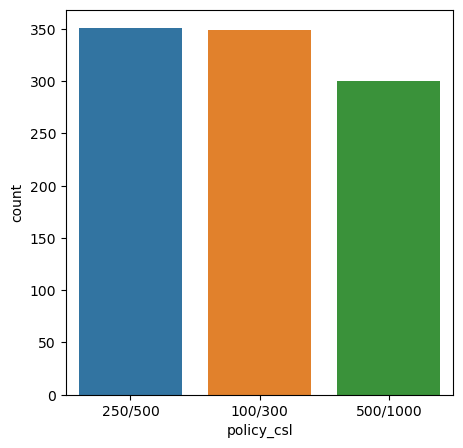

In [72]:
#Count Plot for "policy_csl" column
print(fraud["policy_csl"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("policy_csl",data=fraud)

#### Observations:

policy_csl is more of 250/500 (Total No= 351), then of 100/300 (Total No= 349) and least is of 500/1000 (Total No= 300).

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


<AxesSubplot:xlabel='insured_sex', ylabel='count'>

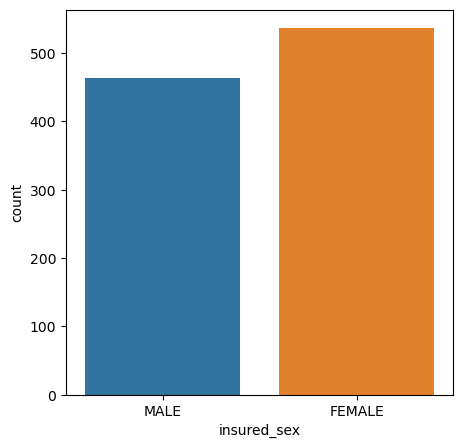

In [73]:
#Count Plot for "insured_sex" column
print(fraud["insured_sex"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("insured_sex",data=fraud)

#### Observations:

Female (Total No= 537) is more compare to Male (Total No= 463)

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

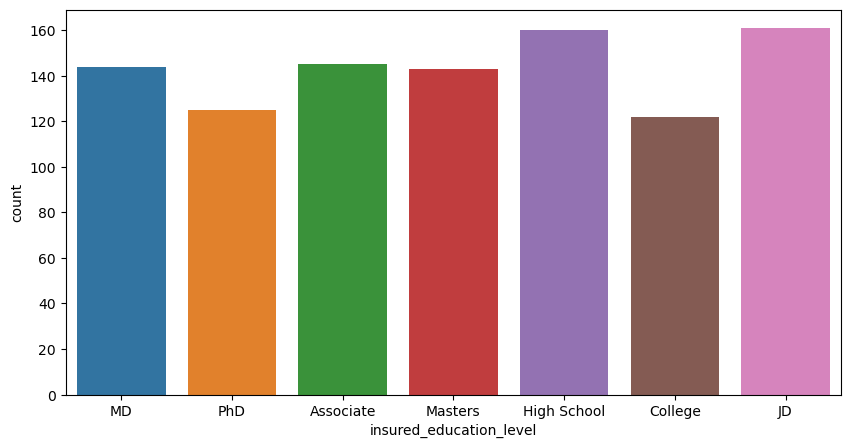

In [74]:
#Count Plot for "insured_education_level" column
print(fraud["insured_education_level"].value_counts())
plt.figure(figsize=(10,5))
sns.countplot("insured_education_level",data=fraud)

#### Observations:

insured_education_level is of JD (Total No= 161) is most then of High School (Total No= 160) and least is of College (Total No= 122).

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


<AxesSubplot:xlabel='insured_occupation', ylabel='count'>

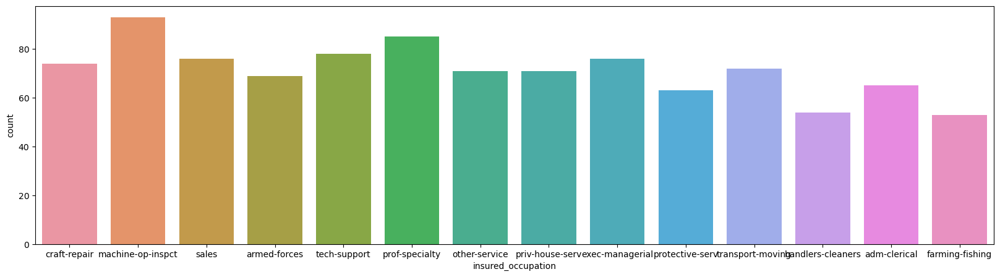

In [75]:
#Count Plot for "insured_occupation" column
print(fraud["insured_occupation"].value_counts())
plt.figure(figsize=(20,5))
sns.countplot("insured_occupation",data=fraud)

#### Observations:

machine-op-inspct (Total No= 93) is most insured_occupation followed by prof-specialty (Total No= 85) and least is farming-fishing (Total No= 53)

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

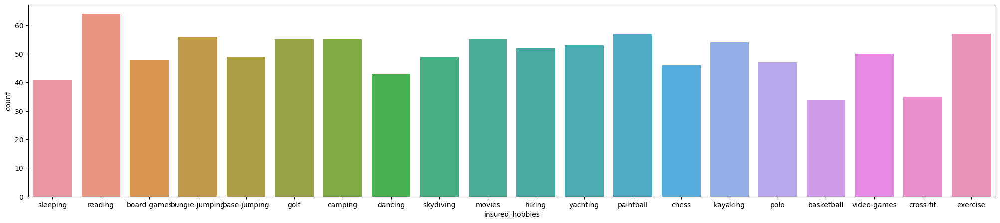

In [76]:
#Count Plot for "insured_hobbies" column
print(fraud["insured_hobbies"].value_counts())
plt.figure(figsize=(25,5))
sns.countplot("insured_hobbies",data=fraud)

#### Observations:

reading is most insured_hobbies and basketball is least.

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

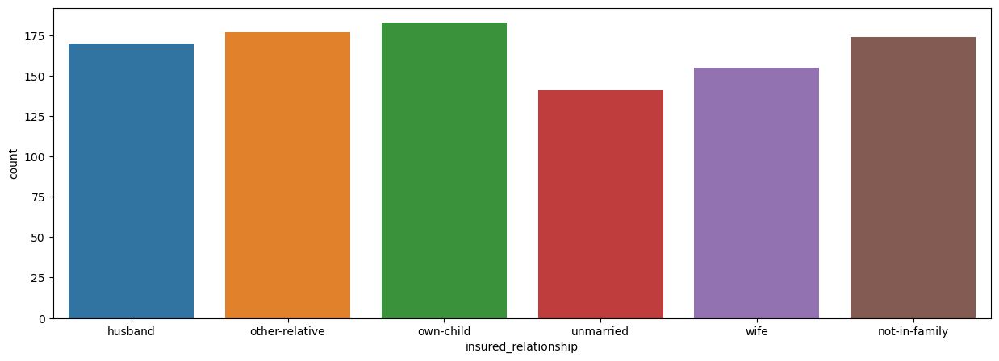

In [77]:
#Count Plot for "insured_relationship" column
print(fraud["insured_relationship"].value_counts())
plt.figure(figsize=(15,5))
sns.countplot("insured_relationship",data=fraud)

#### Observations:

insured_relationship is of own-child is most

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


<AxesSubplot:xlabel='incident_type', ylabel='count'>

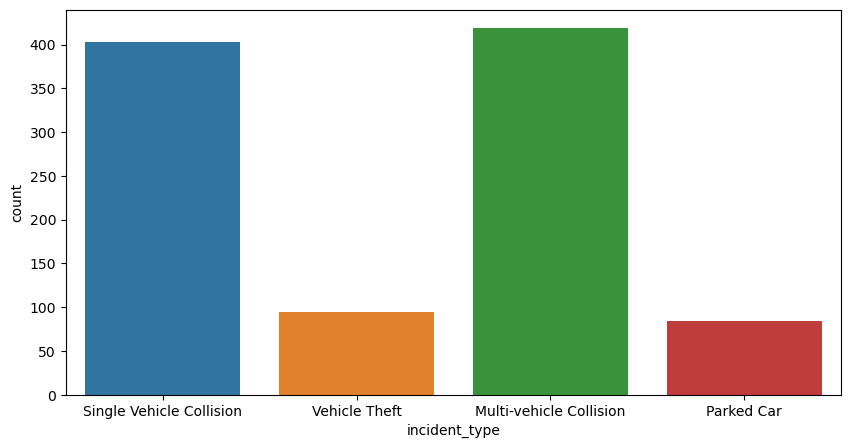

In [78]:
#Count Plot for "incident_type" column
print(fraud["incident_type"].value_counts())
plt.figure(figsize=(10,5))
sns.countplot("incident_type",data=fraud)

#### Observations:

incident_type is most of Multi-vehicle Collision and Parked Car is least.

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


<AxesSubplot:xlabel='collision_type', ylabel='count'>

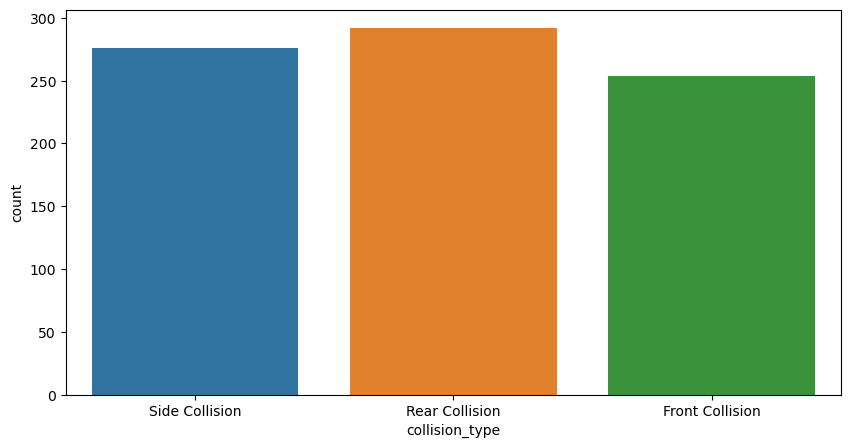

In [79]:
#Count Plot for "collision_type" column
print(fraud["collision_type"].value_counts())
plt.figure(figsize=(10,5))
sns.countplot("collision_type",data=fraud)

#### Observations:

Rear Collision is most collision_type and least is Front Collision

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


<AxesSubplot:xlabel='incident_severity', ylabel='count'>

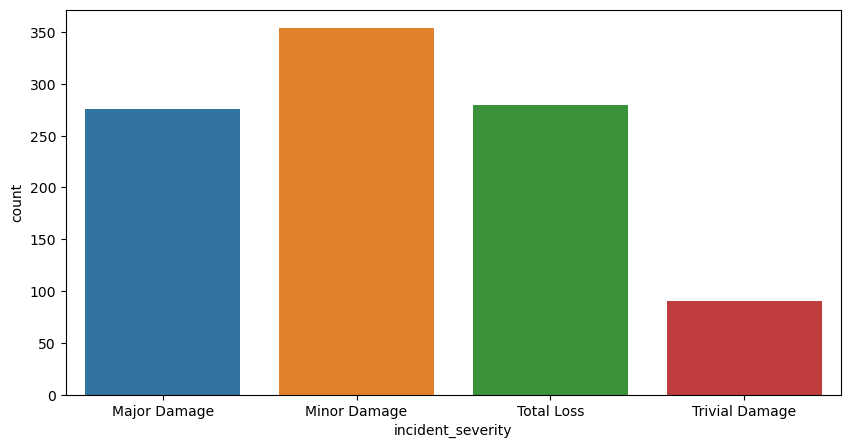

In [80]:
#Count Plot for "incident_severity" column
print(fraud["incident_severity"].value_counts())
plt.figure(figsize=(10,5))
sns.countplot("incident_severity",data=fraud)

#### Observations:

Minor Damage is most incident_severity and least is Trivial Damage

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

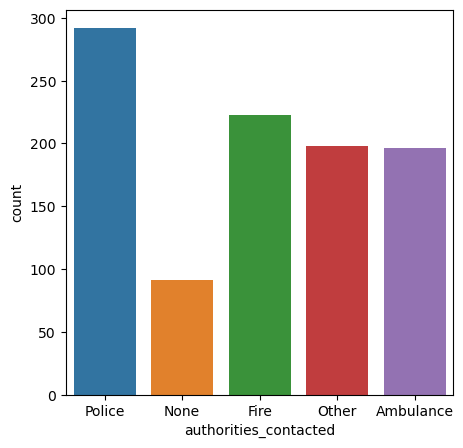

In [81]:
#Count Plot for "authorities_contacted" column
print(fraud["authorities_contacted"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("authorities_contacted",data=fraud)

#### Observations:

Police are most authorities_contacted and least is None.

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


<AxesSubplot:xlabel='incident_state', ylabel='count'>

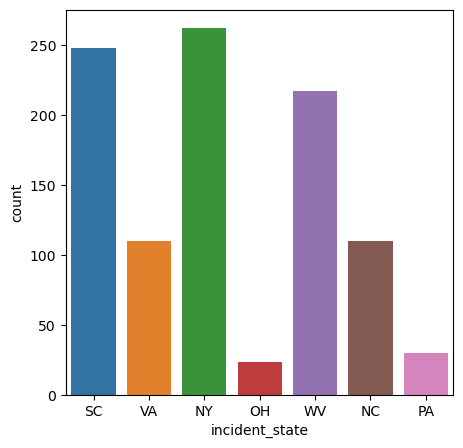

In [82]:
#Count Plot for "incident_state" column
print(fraud["incident_state"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("incident_state",data=fraud)         

#### Observations:

NY is most incident_state and OH is least.

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


<AxesSubplot:xlabel='incident_city', ylabel='count'>

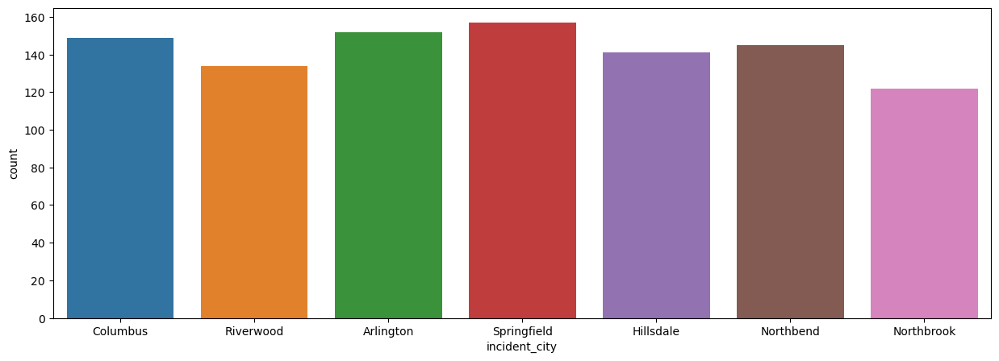

In [83]:
#Count Plot for "incident_city" column
print(fraud["incident_city"].value_counts())
plt.figure(figsize=(15,5))
sns.countplot("incident_city",data=fraud)

#### Observations:

Springfield is most incident_city and Northbrook is least.

9935 4th Drive         1
4214 MLK Ridge         1
8548 Cherokee Ridge    1
2352 MLK Drive         1
9734 2nd Ridge         1
                      ..
6770 1st St            1
4119 Texas St          1
4347 2nd Ridge         1
1091 1st Drive         1
1416 Cherokee Ridge    1
Name: incident_location, Length: 1000, dtype: int64


<AxesSubplot:xlabel='incident_location', ylabel='count'>

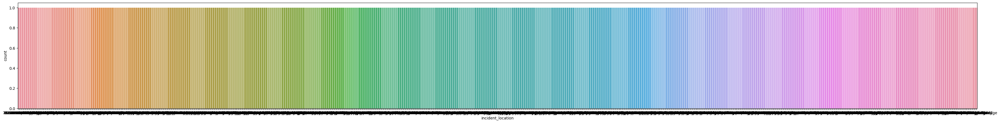

In [84]:
#Count Plot for "incident_location" column
print(fraud["incident_location"].value_counts())
plt.figure(figsize=(45,5))
sns.countplot( "incident_location",data=fraud)

#### Observations:

We can see that there are 1000 location which means incident_location are unique for each insurance claim.

NO     338
YES    302
Name: property_damage, dtype: int64


<AxesSubplot:xlabel='property_damage', ylabel='count'>

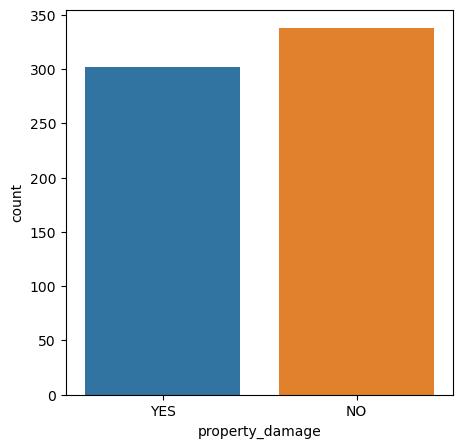

In [85]:
#Count Plot for "property_damage" column
print(fraud["property_damage"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("property_damage",data=fraud)

#### Observations:

Mostly there are NO property_damage.

NO     343
YES    314
Name: police_report_available, dtype: int64


<AxesSubplot:xlabel='police_report_available', ylabel='count'>

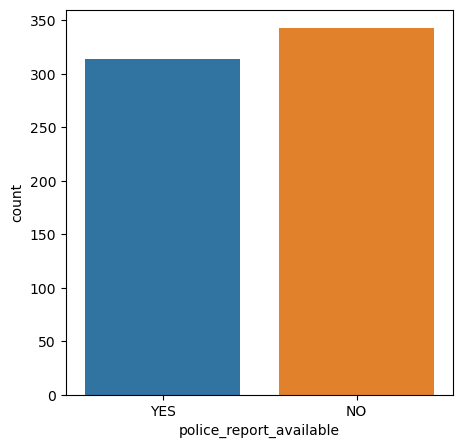

In [86]:
#Count Plot for "police_report_available" column
print(fraud["police_report_available"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("police_report_available",data=fraud)

#### Observations:

Mostly NO police_report_available.

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


<AxesSubplot:xlabel='auto_make', ylabel='count'>

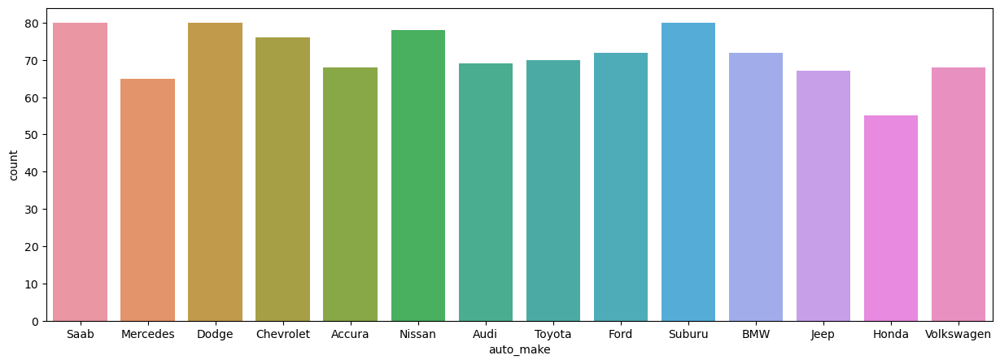

In [87]:
#Count Plot for "auto_make" column
print(fraud["auto_make"].value_counts())
plt.figure(figsize=(15,5))
sns.countplot("auto_make",data=fraud)

#### Observations:

Most auto_make is Saab and least is Honda.

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


<AxesSubplot:xlabel='auto_model', ylabel='count'>

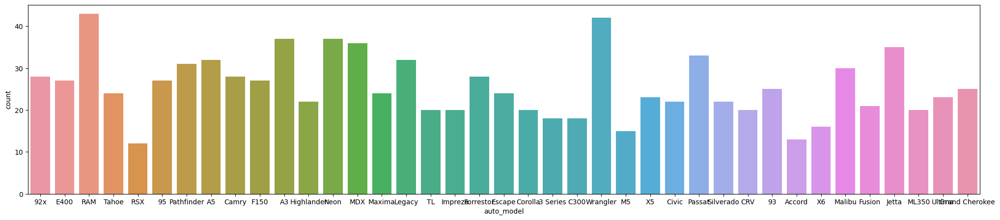

In [88]:
#Count Plot for "auto_model" column
print(fraud["auto_model"].value_counts())
plt.figure(figsize=(25,5))
sns.countplot("auto_model",data=fraud)

#### Observations:

auto_model is of RAM most and RSX least.

N    753
Y    247
Name: fraud_reported, dtype: int64


<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

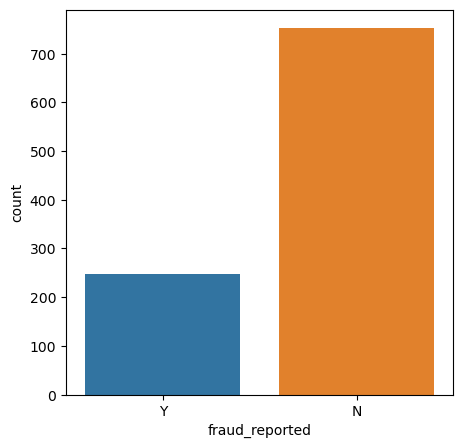

In [90]:
#Count Plot for "fraud_reported" column
print(fraud["fraud_reported"].value_counts())
plt.figure(figsize=(5,5))
sns.countplot("fraud_reported",data=fraud)          

#### Observations:

Mostly NO fraud is reported (Total No= 753) and Least YES fraud reported (Total No= 247)

### Using Histplot

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


<AxesSubplot:xlabel='months_as_customer', ylabel='Count'>

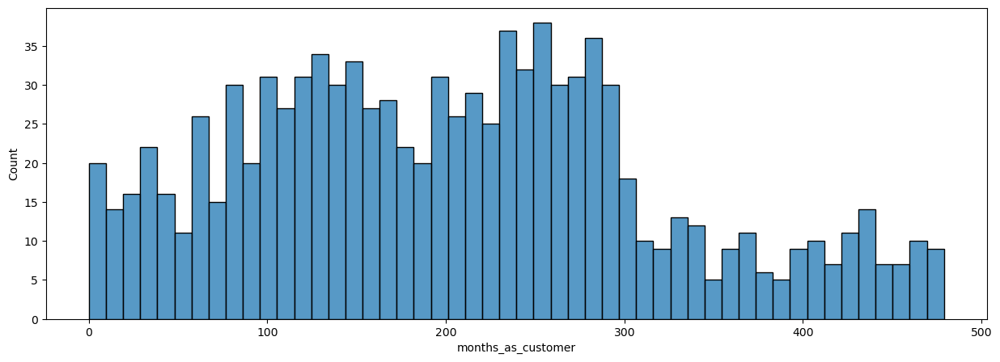

In [91]:
#HistPlot for "months_as_customer" column
print(fraud["months_as_customer"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="months_as_customer",data=fraud,bins=50)

Mostly Total No of 8 are 194 months_as_customer.

43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


<AxesSubplot:xlabel='age', ylabel='Count'>

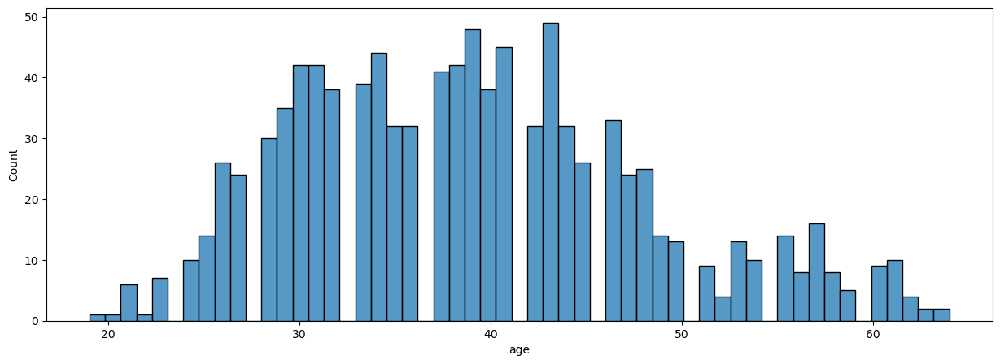

In [92]:
#HistPlot for "age" column
print(fraud["age"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="age",data=fraud,bins=55)

Age of 43 is most (Total No= 49)

521585    1
687755    1
674485    1
223404    1
991480    1
         ..
563878    1
620855    1
583169    1
337677    1
556080    1
Name: policy_number, Length: 1000, dtype: int64


<AxesSubplot:xlabel='policy_number', ylabel='Count'>

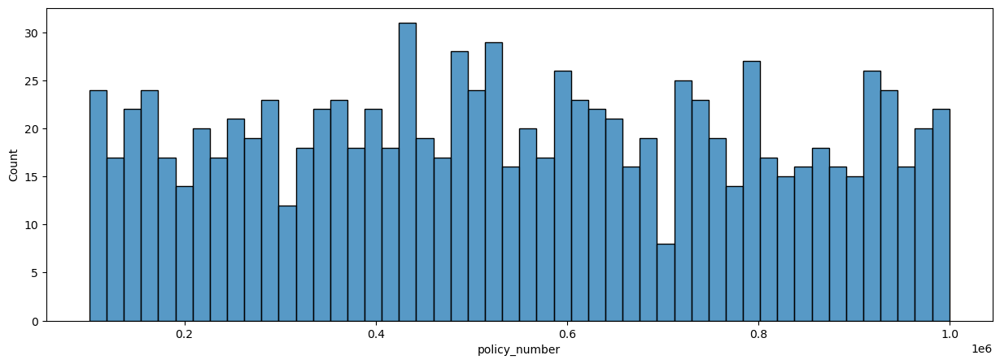

In [93]:
#HistPlot for "policy_number" column
print(fraud["policy_number"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="policy_number",data=fraud,bins=50)

policy_number is also unique for each insurance claim.

1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64


<AxesSubplot:xlabel='policy_deductable', ylabel='Count'>

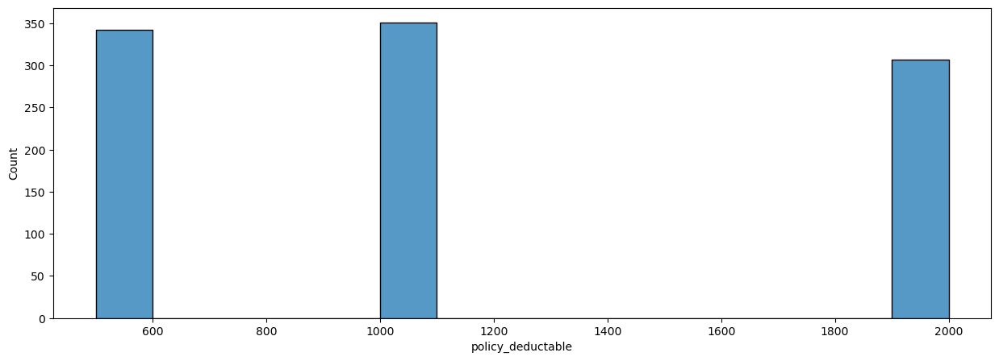

In [94]:
#HistPlot for "policy_deductable" column
print(fraud["policy_deductable"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="policy_deductable",data=fraud,bins=15)

There are 3 policy_deductable amount: 1000,500 & 2000 and most people have chosen 1000 and least 2000.

1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: policy_annual_premium, Length: 991, dtype: int64


<AxesSubplot:xlabel='policy_annual_premium', ylabel='Count'>

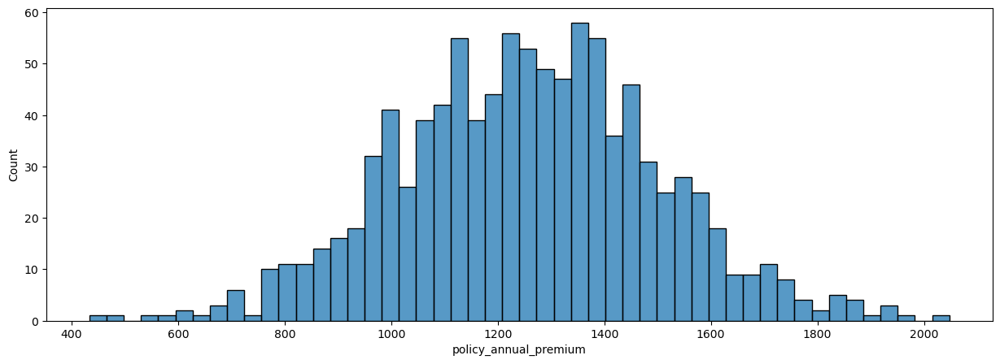

In [95]:
#HistPlot for "policy_annual_premium" column
print(fraud["policy_annual_premium"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="policy_annual_premium",data=fraud,bins=50)

1558.29 is mostly chosen for policy_annual_premium.

 1101000     798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64


<AxesSubplot:xlabel='umbrella_limit', ylabel='Count'>

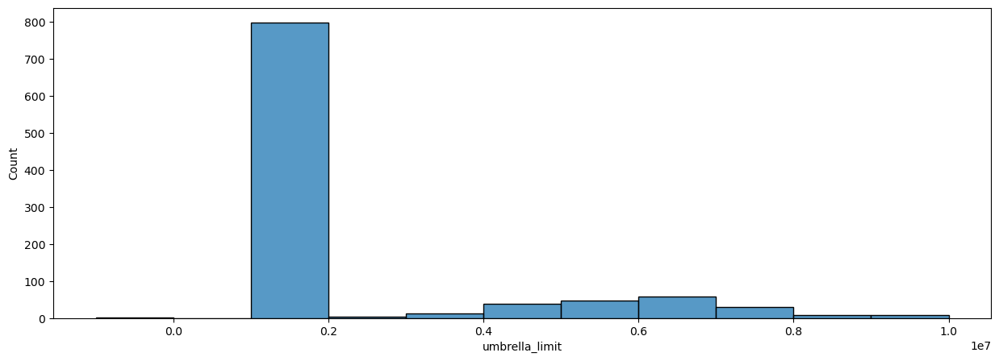

In [96]:
#HistPlot for "umbrella_limit" column
print(fraud["umbrella_limit"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="umbrella_limit",data=fraud,bins=11)

1101000 is set mostly as umbrella_limit in 798 insurance and -1000000 is least in 1 insurance.

477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: insured_zip, Length: 995, dtype: int64


<AxesSubplot:xlabel='insured_zip', ylabel='Count'>

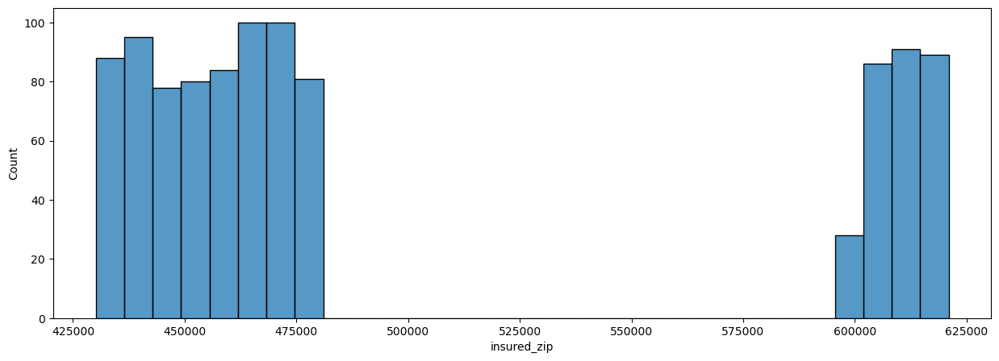

In [97]:
#HistPlot for "insured_zip" column
print(fraud["insured_zip"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="insured_zip",data=fraud,bins=30)

477695 is most insured_zip.

25126.1    508
46300.0      5
51500.0      4
68500.0      4
55600.0      3
          ... 
36700.0      1
54900.0      1
69200.0      1
48800.0      1
50300.0      1
Name: capital-gains, Length: 338, dtype: int64


<AxesSubplot:xlabel='capital-gains', ylabel='Count'>

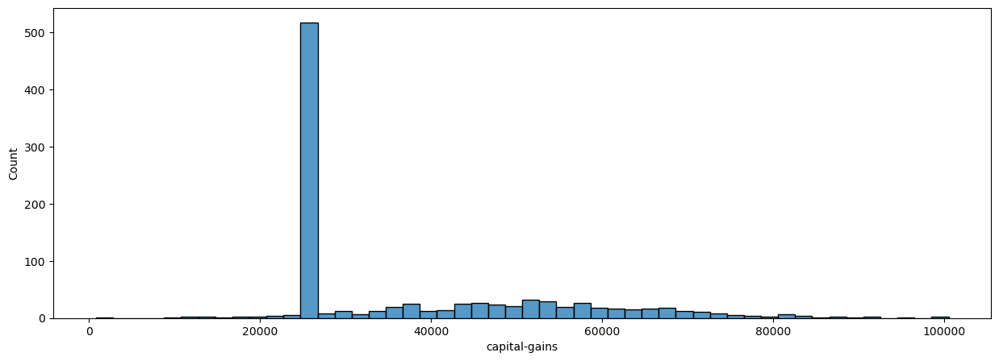

In [99]:
#HistPlot for "capital-gains" column
print(fraud["capital-gains"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="capital-gains",data=fraud,bins=50)

25126.1 is highest capital-gains.

-26793.7    475
-31700.0      5
-53700.0      5
-50300.0      5
-45300.0      4
           ... 
-12100.0      1
-17000.0      1
-72900.0      1
-19700.0      1
-82100.0      1
Name: capital-loss, Length: 354, dtype: int64


<AxesSubplot:xlabel='capital-loss', ylabel='Count'>

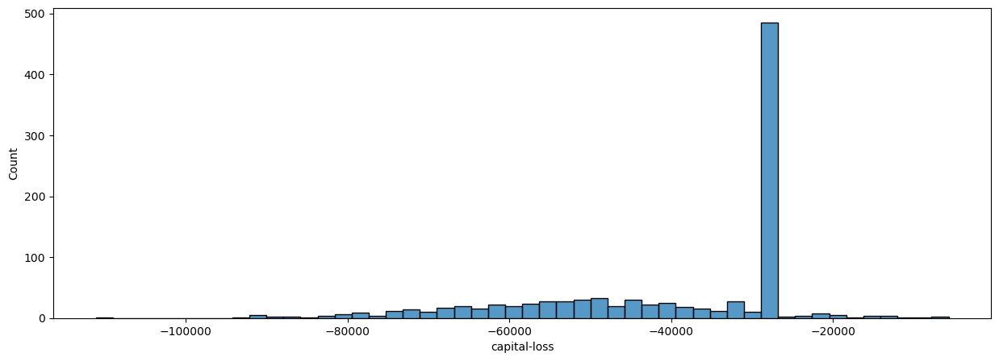

In [100]:
#HistPlot for "capital-loss" column
print(fraud["capital-loss"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="capital-loss",data=fraud,bins=50)

-26793.7 is highest capital-loss.

17    54
3     53
0     52
23    51
16    49
13    46
10    46
4     46
6     44
9     43
14    43
21    42
18    41
12    40
19    40
7     40
15    39
22    38
8     36
20    34
5     33
2     31
11    30
1     29
Name: incident_hour_of_the_day, dtype: int64


<AxesSubplot:xlabel='incident_hour_of_the_day', ylabel='Count'>

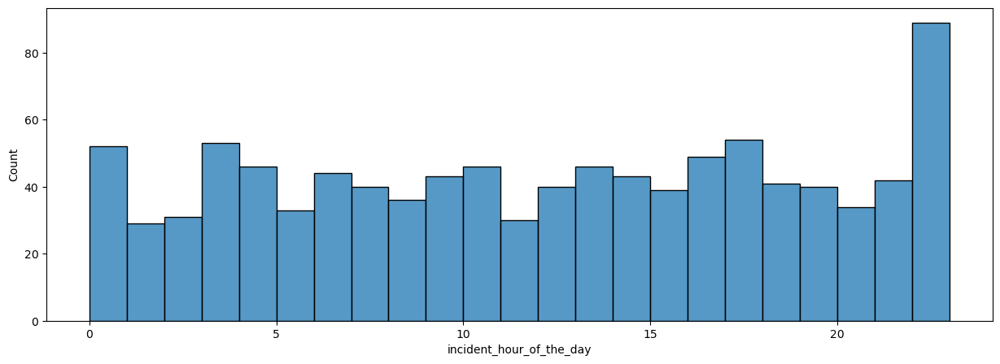

In [101]:
#HistPlot for "incident_hour_of_the_day" column
print(fraud["incident_hour_of_the_day"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="incident_hour_of_the_day",data=fraud,bins=23)

17 is the highest incident_hour_of_the_day (Total No= 54) and 1 is least incident_hour_of_the_day (Total No= 29).

1    581
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64


<AxesSubplot:xlabel='number_of_vehicles_involved', ylabel='Count'>

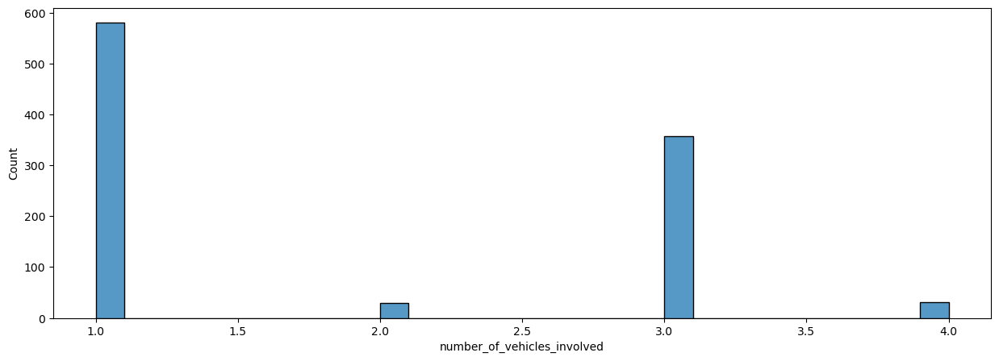

In [102]:
#HistPlot for "number_of_vehicles_involved" column
print(fraud["number_of_vehicles_involved"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="number_of_vehicles_involved",data=fraud,bins=30)

1. There are 4 number_of_vehicles_involved: 1, 2,3 & 4
2. 1 is involved most (Total No= 581) followed by 3 (Total No= 358) then 4 is involved (Total No= 31) and least 2 is involved (Total No= 30).

0    340
2    332
1    328
Name: bodily_injuries, dtype: int64


<AxesSubplot:xlabel='bodily_injuries', ylabel='Count'>

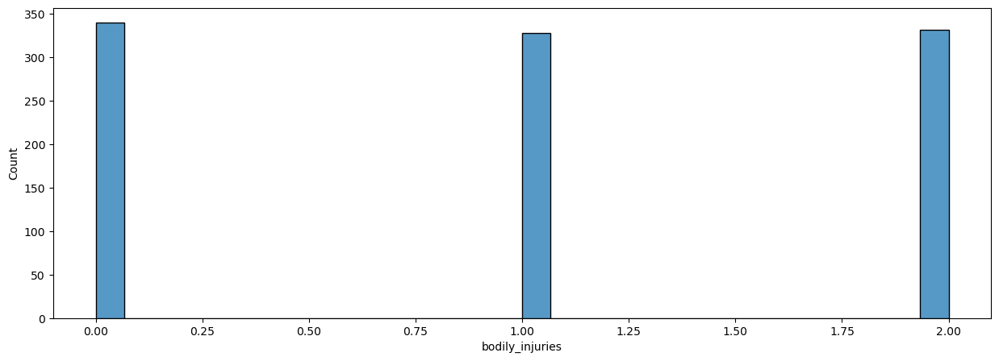

In [103]:
#HistPlot for "bodily_injuries" column
print(fraud["bodily_injuries"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="bodily_injuries",data=fraud,bins=30)

1. There are 3 bodily_injuries : 0, 1 & 2.
2. 0 bodily_injuries is highest (Total No= 340) then 2 bodily_injuries (Total No= 332) and least is 1 (Total No= 328).

1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64


<AxesSubplot:xlabel='witnesses', ylabel='Count'>

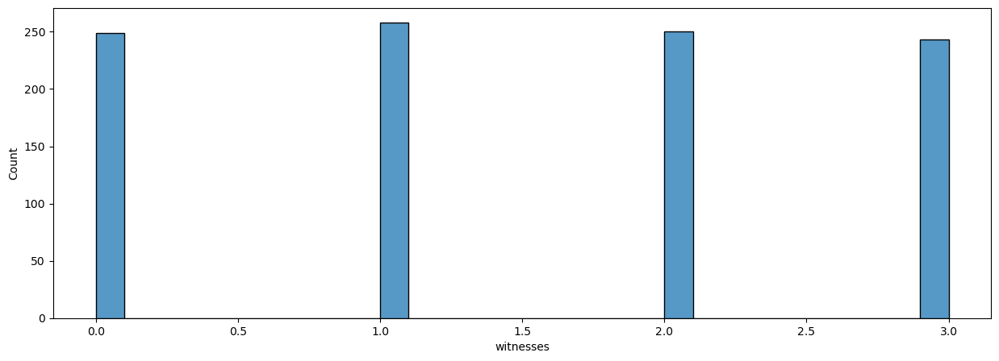

In [104]:
#HistPlot for "witnesses" column
print(fraud["witnesses"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="witnesses",data=fraud,bins=30)

1. There are 4 type of witnesses: 0, 1, 2 & 3
2. Type 1 witnesses are most (Total No= 258)
3. Type 3 witnesses are least (Total No= 243)

59400    5
2640     4
70400    4
4320     4
44200    4
        ..
65250    1
87100    1
6240     1
66600    1
67500    1
Name: total_claim_amount, Length: 763, dtype: int64


<AxesSubplot:xlabel='total_claim_amount', ylabel='Count'>

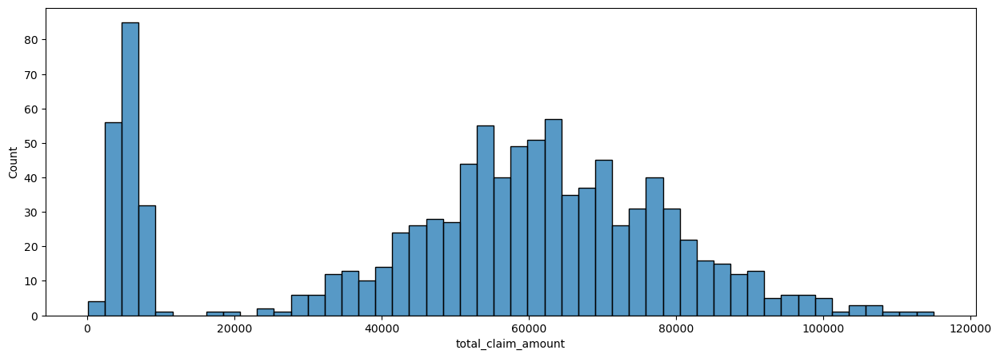

In [105]:
#HistPlot for "total_claim_amount" column
print(fraud["total_claim_amount"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="total_claim_amount",data=fraud,bins=50)     

59400 is highest total_claim_amount

7433.42     25
640.00       7
480.00       7
660.00       5
580.00       5
            ..
14840.00     1
6580.00      1
11820.00     1
16650.00     1
7500.00      1
Name: injury_claim, Length: 638, dtype: int64


<AxesSubplot:xlabel='injury_claim', ylabel='Count'>

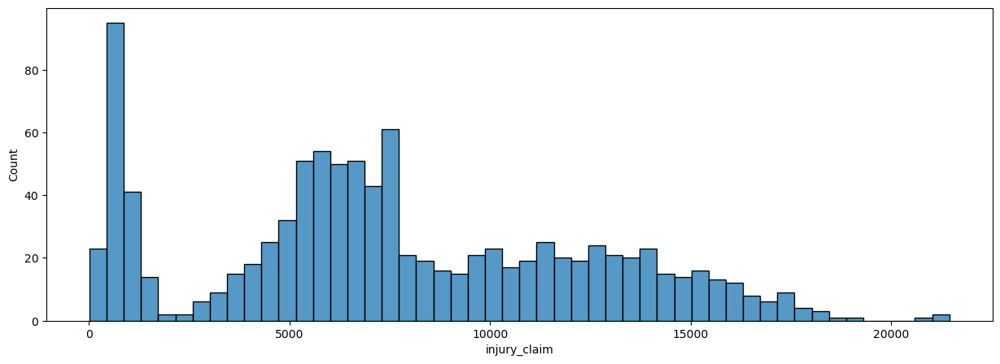

In [106]:
#HistPlot for "injury_claim" column
print(fraud["injury_claim"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="injury_claim",data=fraud,bins=50) 

7433.42 is highest injury_claim (Total No= 25).

7399.57     19
860.00       6
480.00       5
660.00       5
10000.00     5
            ..
3590.00      1
6480.00      1
4580.00      1
4920.00      1
7500.00      1
Name: property_claim, Length: 626, dtype: int64


<AxesSubplot:xlabel='property_claim', ylabel='Count'>

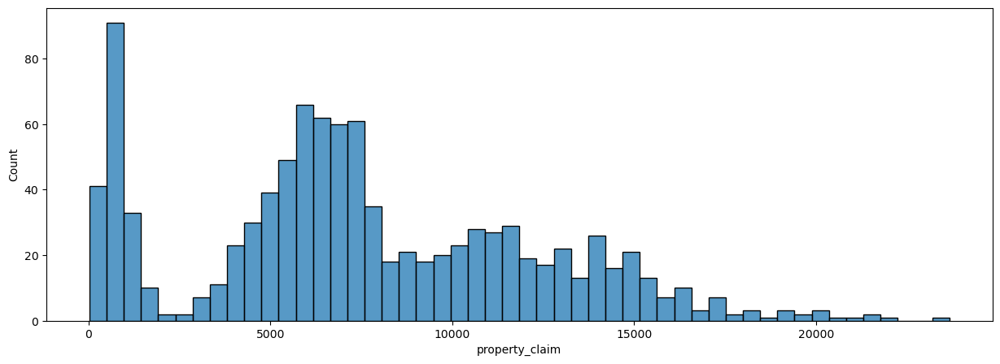

In [107]:
#HistPlot for "property_claim" column
print(fraud["property_claim"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="property_claim",data=fraud,bins=50) 

7399.57 is highest property_claim (Total No= 19)

5040     7
3360     6
52080    5
4720     5
3600     5
        ..
43360    1
25130    1
38940    1
47430    1
52500    1
Name: vehicle_claim, Length: 726, dtype: int64


<AxesSubplot:xlabel='vehicle_claim', ylabel='Count'>

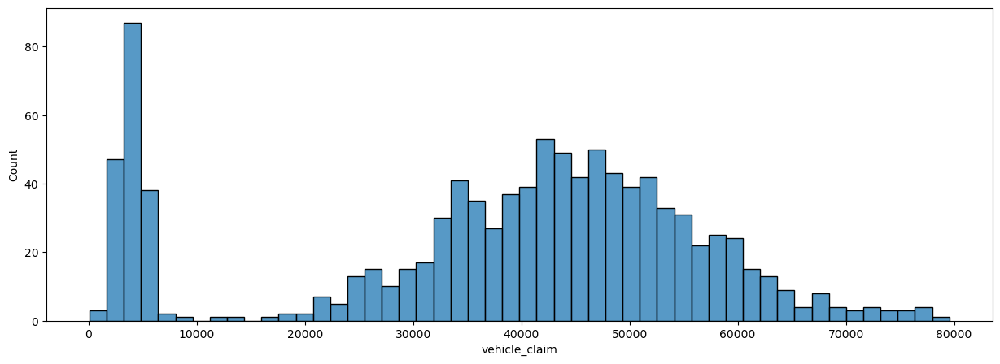

In [108]:
#Histplot for "vehicle_claim" column
print(fraud["vehicle_claim"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="vehicle_claim",data=fraud,bins=50) 

5040 is highest vehicle_claim (Total No= 7)

1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2009    50
2010    50
2013    49
2002    49
2015    47
1997    46
2012    46
2008    45
2014    44
2001    42
2000    42
1998    40
2004    39
1996    37
Name: auto_year, dtype: int64


<AxesSubplot:xlabel='auto_year', ylabel='Count'>

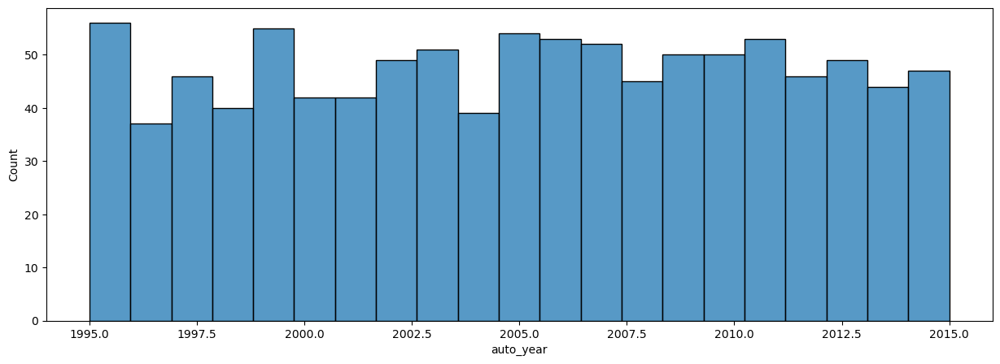

In [109]:
#Histplot for "auto_year" column
print(fraud["auto_year"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="auto_year",data=fraud,bins=21) 

1995 is highest auto_year

25    55
14    50
24    48
26    48
19    44
2     43
7     43
20    43
15    41
10    41
22    41
11    40
17    40
9     40
21    39
6     38
13    37
12    36
4     36
3     35
8     33
23    33
5     32
16    31
18    30
1      3
Name: Policy_Bind_Age, dtype: int64


<AxesSubplot:xlabel='Policy_Bind_Age', ylabel='Count'>

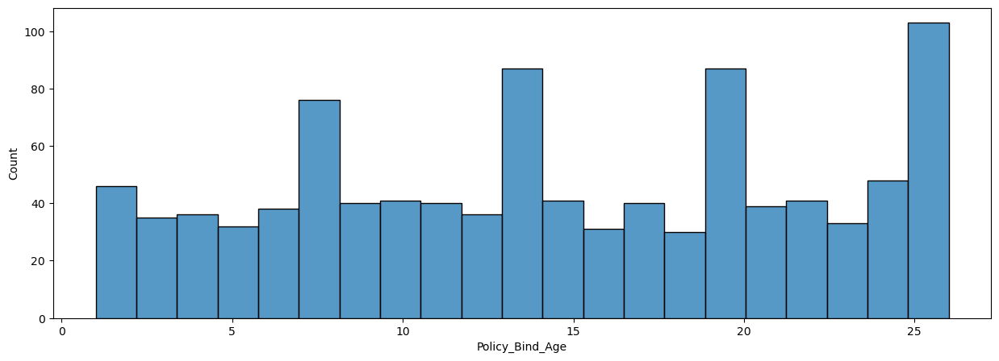

In [110]:
#Histplot for "Policy_Bind_Age" column
print(fraud["Policy_Bind_Age"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="Policy_Bind_Age",data=fraud,bins=21) 

25 is highest Policy_Bind_Age

1     365
2     312
8      39
12     39
6      37
4      36
7      35
10     34
3      31
9      30
5      23
11     19
Name: Incident_Month, dtype: int64


<AxesSubplot:xlabel='Incident_Month', ylabel='Count'>

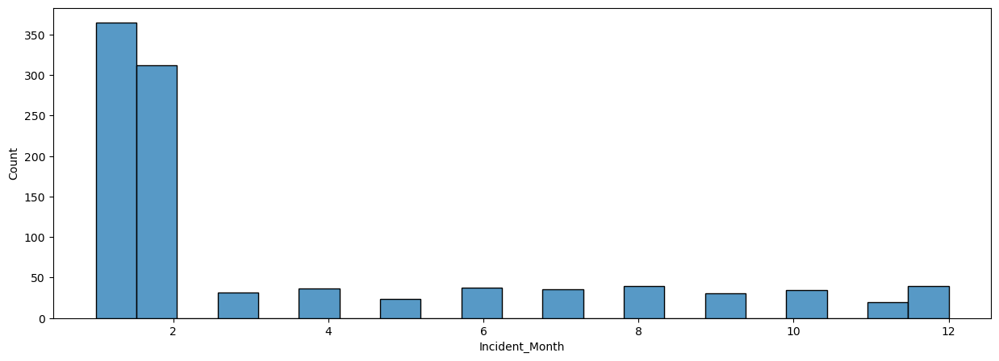

In [111]:
#Histplot for "Incident_Month" column
print(fraud["Incident_Month"].value_counts())
plt.figure(figsize=(15,5))
sns.histplot(x="Incident_Month",data=fraud,bins=21)

1(January) is highest Incident_Month

# Bivariate Analysis

### Using Countplot

<AxesSubplot:xlabel='policy_state', ylabel='count'>

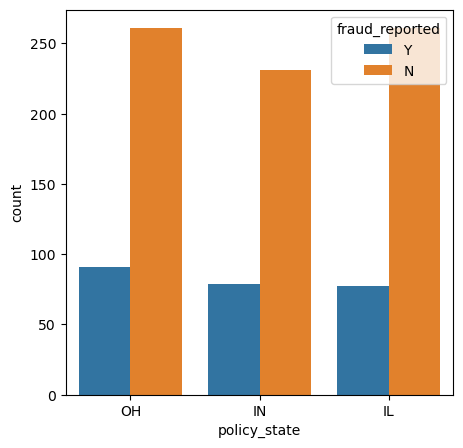

In [112]:
#Count Plot for comparision between "policy_state" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("policy_state",data=fraud, hue='fraud_reported')

#### Observations:

We can see in OH policy_state is fraud_reported most among other IN & IL policy_state but Not fraud_reported is also highest of OH policy_state.

<AxesSubplot:xlabel='policy_csl', ylabel='count'>

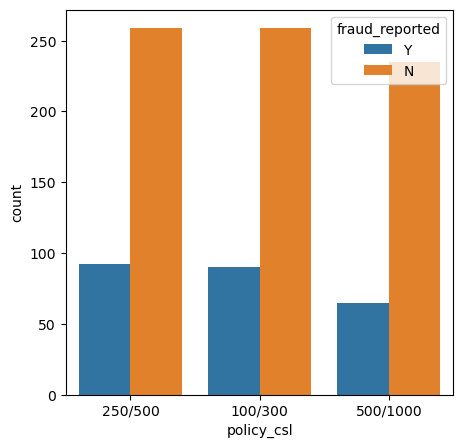

In [113]:
#Count Plot for comparision between "policy_csl" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("policy_csl",data=fraud, hue='fraud_reported')

#### Observations:

1. plolicy_csl 250/500 and 100/300 have equal number of fraud_reported and not fraud_reported but more than 500/1000 in both cases. So, from this we can not determine fraud_reported is or not.
2. Not fraud_reported is more in each policy_csl compare to fraud_reported

<AxesSubplot:xlabel='insured_sex', ylabel='count'>

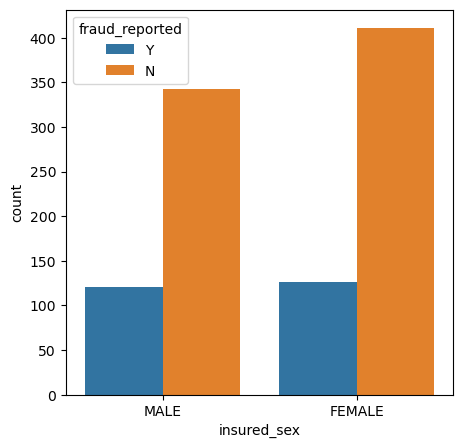

In [114]:
#Count Plot for comparision between "insured_sex" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("insured_sex",data=fraud, hue='fraud_reported')

#### Observations:

1. Not fraud_reported is more in Female compare to fraud_reported
2. But Female are reported more fraud compare to Male in case of sex
3. Not fraud_reported is more in each insured_sex

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

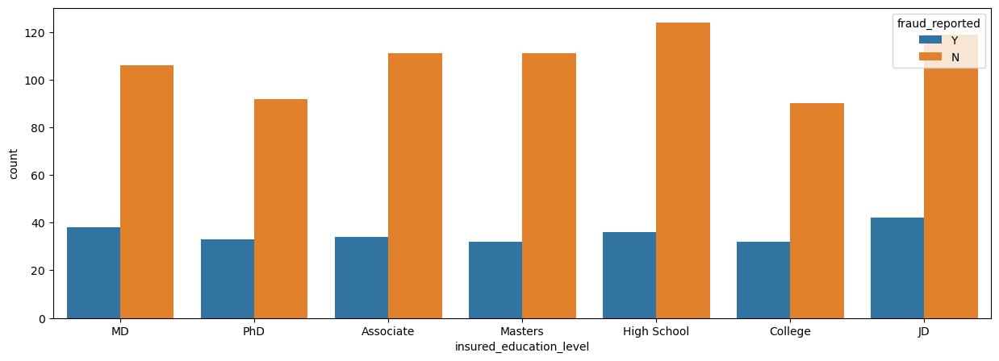

In [115]:
#Count Plot for comparision between "insured_education_level" column and "fraud_reported" column
plt.figure(figsize=(15,5))
sns.countplot("insured_education_level",data=fraud, hue='fraud_reported')

#### Observations:

1. Mostly High School have not fraud_reported
2. JD is mostly fraud_reported than other insured_education_level but not fraud_reported is highedt in JD insured_education_level compare to fraud_reported
3. Not fraud_reported is highest in each insured_education_level

<AxesSubplot:xlabel='insured_occupation', ylabel='count'>

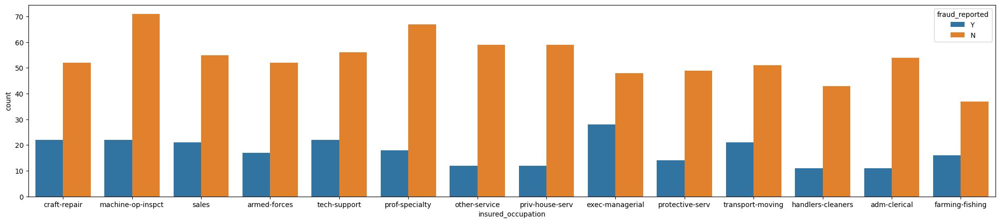

In [116]:
#Count Plot for comparision between "insured_occupation" column and "fraud_reported" column
plt.figure(figsize=(25,5))
sns.countplot("insured_occupation",data=fraud, hue='fraud_reported')

#### Observations:

1. Highest fraud_reported is of exec-managerial
2. Least fraud_reported is of handlers-cleaners
3. Not fraud_reported is highest of machine-op-inspct
4. Not fraud_reported least is of farming-fishing
5. But mostly in each insured_occupation not fraud_reported is highest

<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

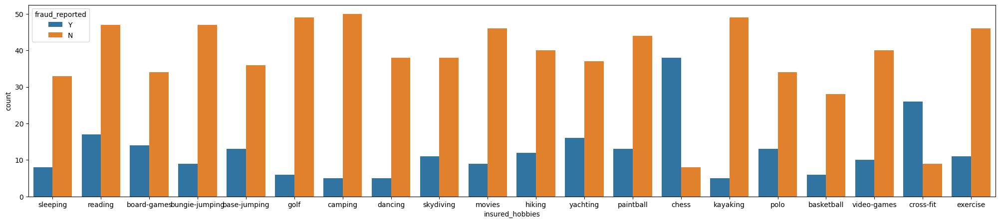

In [117]:
#Count Plot for comparision between "insured_hobbies" column and "fraud_reported" column
plt.figure(figsize=(25,5))
sns.countplot("insured_hobbies",data=fraud, hue='fraud_reported')

#### Observations:

1. fraud_reported in chess is highest compare to other insured_hobbies and least in Camping & Dancing.
2. Not fraud_reported is highest in Camping insured_hobbies

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

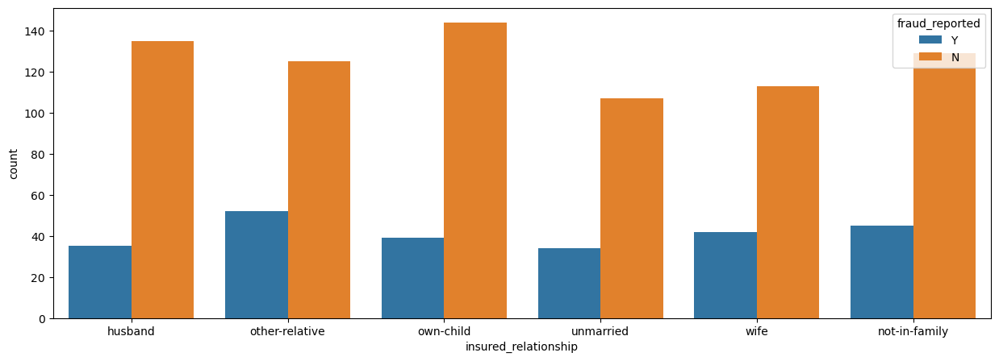

In [118]:
#Count Plot for comparision between "insured_relationship" column and "fraud_reported" column
plt.figure(figsize=(15,5))
sns.countplot("insured_relationship",data=fraud, hue='fraud_reported')

#### Observations:

1. Not fraud_reported is highest in own-child insured_relationship compare to other insured_relationship
2. Not fraud_reported is highest in each insured_relationship compare to fraud_reported

<AxesSubplot:xlabel='incident_type', ylabel='count'>

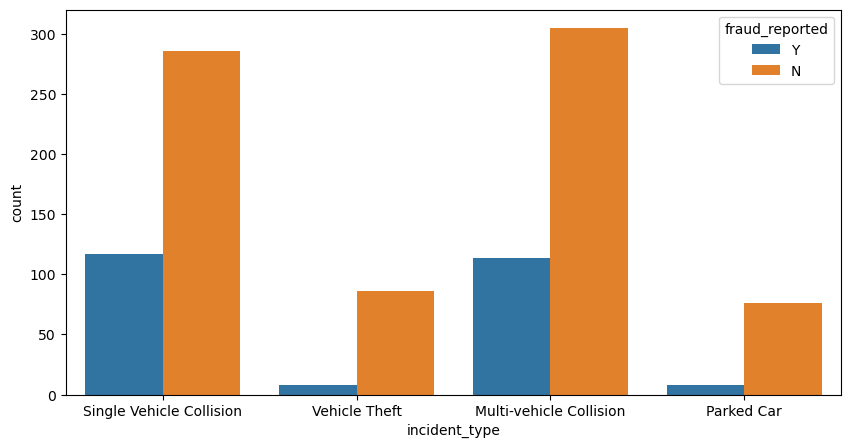

In [119]:
#Count Plot for comparision between "incident_type" column and "fraud_reported" column
plt.figure(figsize=(10,5))
sns.countplot("incident_type",data=fraud, hue='fraud_reported')

#### Observations:

Multi-vehicle Collision is highest for Not fraud_reported compare to other incident_type

<AxesSubplot:xlabel='collision_type', ylabel='count'>

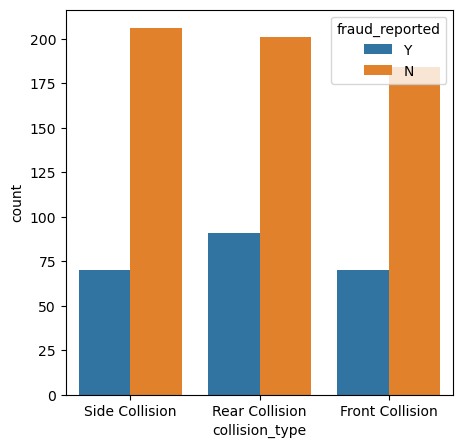

In [120]:
#Count Plot for comparision between "collision_type" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("collision_type",data=fraud, hue='fraud_reported')

#### Observations:

1. Side Collision is highest No fraud_reported collision_type compare to other collision_type and fraud_reported
2. Rear Collision is having highest fraud_reported compare to other collision_type

<AxesSubplot:xlabel='incident_severity', ylabel='count'>

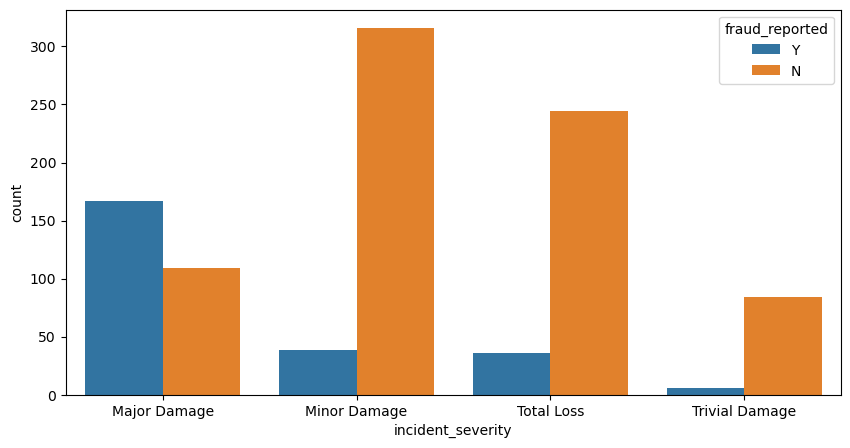

In [121]:
#Count Plot for comparision between "incident_severity" column and "fraud_reported" column
plt.figure(figsize=(10,5))
sns.countplot("incident_severity",data=fraud, hue='fraud_reported')     

#### Observations:

1. Minor Damage is having highest No fraud_reported compare to other incident_severity and fraud_reported
2. Major Damage is having highest fraud_reported compare to other incident_severity

<AxesSubplot:xlabel='authorities_contacted', ylabel='count'>

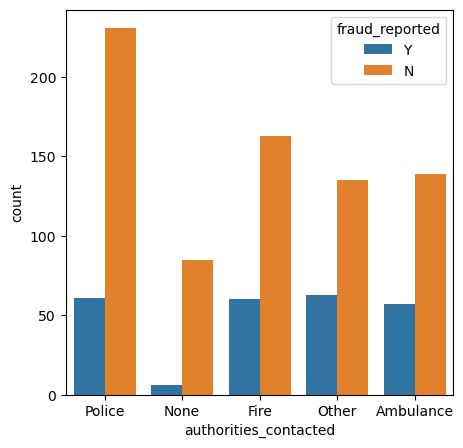

In [122]:
#Count Plot for comparision between "authorities_contacted" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("authorities_contacted",data=fraud, hue='fraud_reported')

#### Observations:

1. Police is having highest No fraud_reported compare to other authorities_contacted and fraud_reported
2. Other is having highest fraud_reported compare to other authorities_contacted

<AxesSubplot:xlabel='incident_state', ylabel='count'>

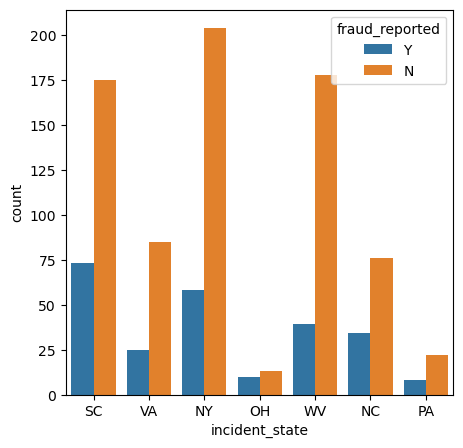

In [123]:
#Count Plot for comparision between "incident_state" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("incident_state",data=fraud, hue='fraud_reported')

#### Observations:

1. NY is having highest No fraud_reported compare to other incident_state and fraud_reported
2. SC is having highest fraud_reported compare to other incident_state

<AxesSubplot:xlabel='incident_city', ylabel='count'>

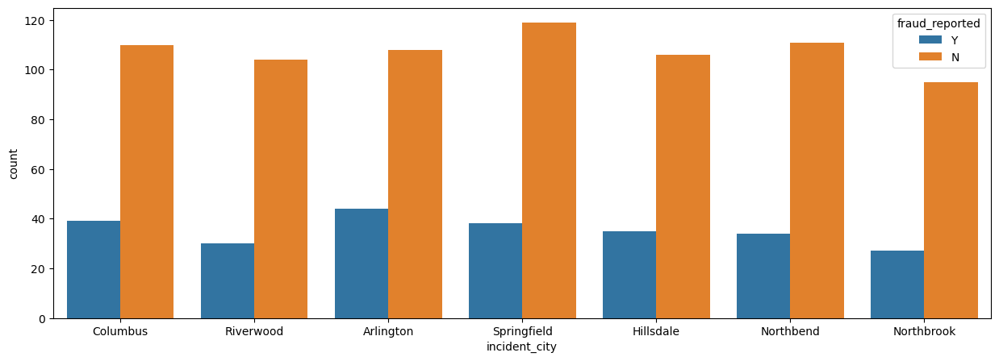

In [124]:
#Count Plot for comparision between "incident_city" column and "fraud_reported" column
plt.figure(figsize=(15,5))
sns.countplot("incident_city",data=fraud, hue='fraud_reported')

#### Observations:

1. Springfield is having highest No fraud_reported compare to other incident_city and fraud_reported
2. Arlington is having highest fraud_reported compare to other incident_city

<AxesSubplot:xlabel='property_damage', ylabel='count'>

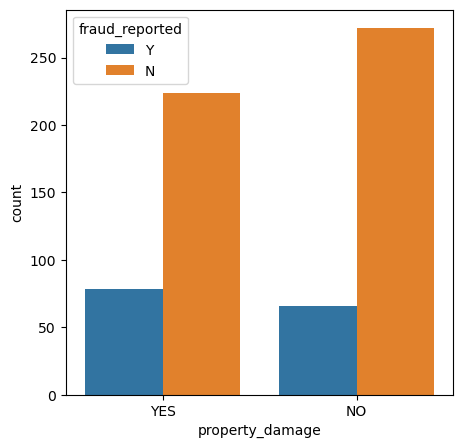

In [125]:
#Count Plot for comparision between "property_damage" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("property_damage",data=fraud, hue='fraud_reported')

#### Observations:

Not fraud_reported for property_damage is most compare to fraud_reported for property_damage

<AxesSubplot:xlabel='police_report_available', ylabel='count'>

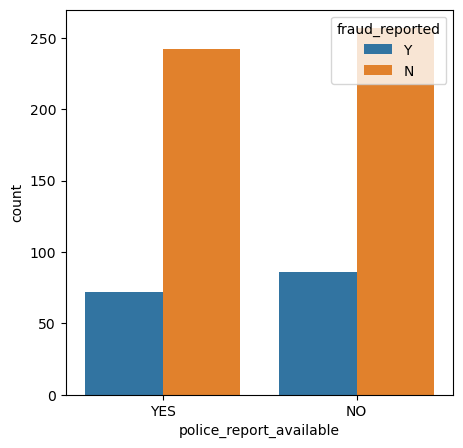

In [126]:
#Count Plot for comparision between "police_report_available" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.countplot("police_report_available",data=fraud, hue='fraud_reported')

#### Observations:

1. Not fraud_reported is highest in both cases: police_report_available and Not police_report_available.
2. But Not police_report_available is more compare to police_report_available

<AxesSubplot:xlabel='auto_make', ylabel='count'>

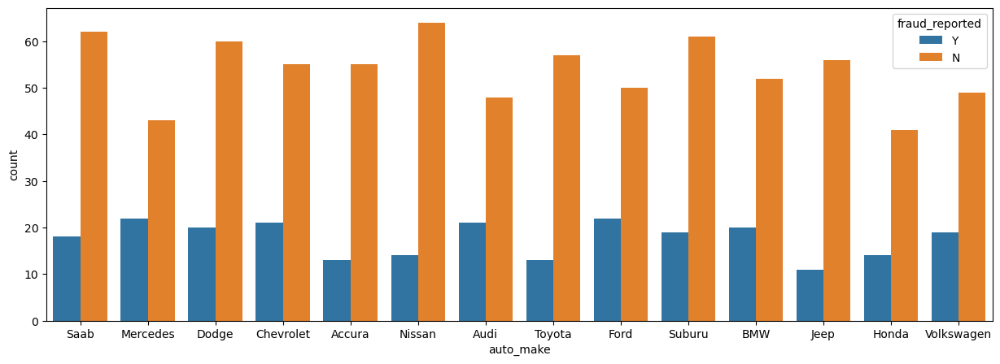

In [127]:
#Count Plot for comparision between "auto_make" column and "fraud_reported" column
plt.figure(figsize=(15,5))
sns.countplot("auto_make",data=fraud, hue='fraud_reported')

#### Obseervations:

1. No fraud_reported is highest in each auto_make
2. Nissan auto_make have highest No fraud_reported
3. Mercedes have highest fraud_reported but compare to No fraud_reported it is less.

<AxesSubplot:xlabel='auto_model', ylabel='count'>

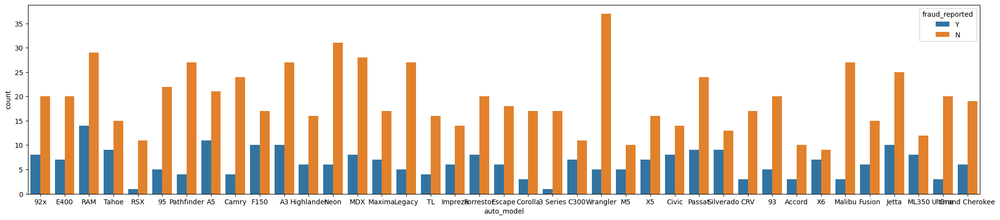

In [128]:
#Count Plot for comparision between "auto_model" column and "fraud_reported" column
plt.figure(figsize=(25,5))
sns.countplot("auto_model",data=fraud, hue='fraud_reported')

#### Observations:

Wrangler have highest No fraud_reported compare to other auto_model.

### Using BarPlot for comparision

<AxesSubplot:xlabel='fraud_reported', ylabel='months_as_customer'>

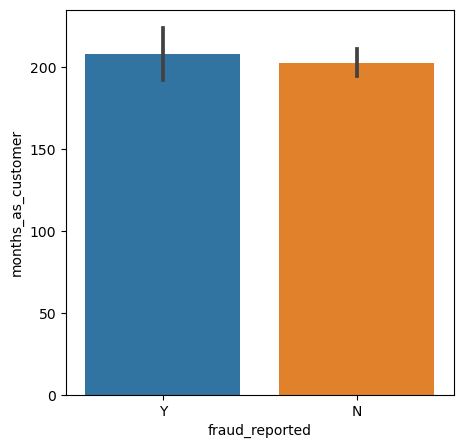

In [129]:
#Bar Plot for comparision between "months_as_customer" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="months_as_customer",data=fraud, x='fraud_reported')

More than 200 above months_as_customer have highest fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='age'>

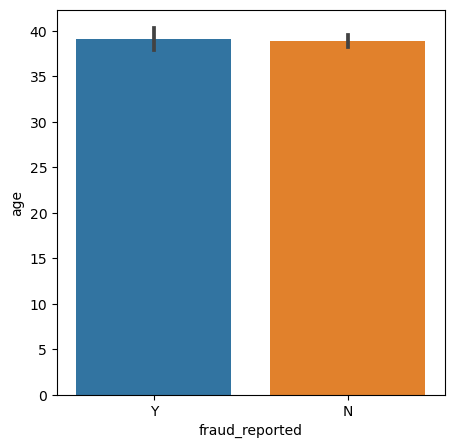

In [130]:
#Bar Plot for comparision between "age" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="age",data=fraud, x='fraud_reported')

Not able to determine fraud_reported or not on the basis of age as it is equal for both cases.

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_number'>

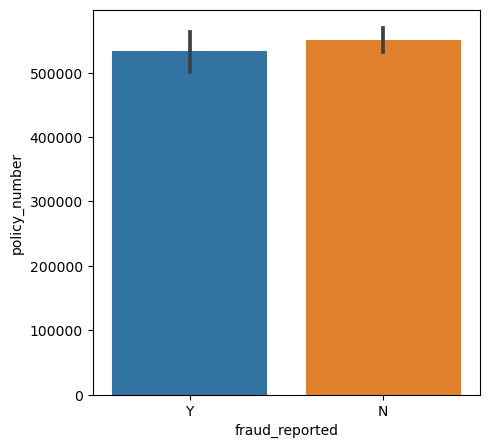

In [132]:
#Bar Plot for comparision between "policy_number" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="policy_number",data=fraud, x='fraud_reported')

Not fraud_reported is highest of more than 550000 policy_number.

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_deductable'>

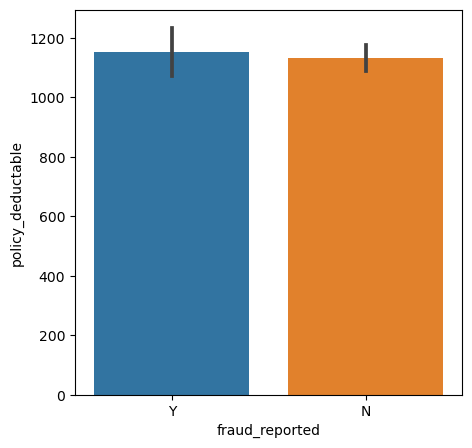

In [133]:
#Bar Plot for comparision between "policy_deductable" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="policy_deductable",data=fraud, x='fraud_reported')

fraud_reported is little more compare to no fraud_reported in case of policy_deductable of 1150

<AxesSubplot:xlabel='fraud_reported', ylabel='policy_annual_premium'>

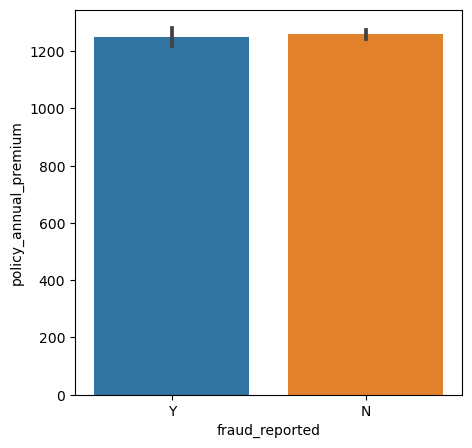

In [134]:
#Bar Plot for comparision between "policy_annual_premium" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="policy_annual_premium",data=fraud, x='fraud_reported')

There is a little difference between fraud_reported and not in case of policy_annual_premium.

<AxesSubplot:xlabel='fraud_reported', ylabel='umbrella_limit'>

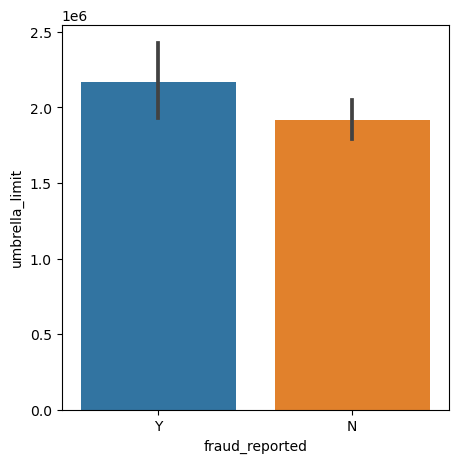

In [135]:
#Barplot for comparision between "umbrella_limit" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="umbrella_limit",data=fraud, x='fraud_reported')

fraud_reported is more in case of umbrella_limit of more than 2.2

<AxesSubplot:xlabel='fraud_reported', ylabel='insured_zip'>

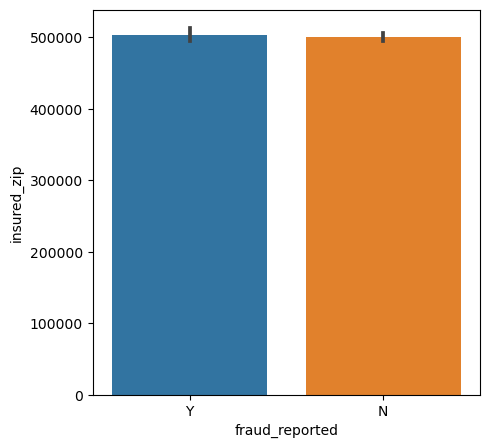

In [136]:
#Bar Plot for comparision between "insured_zip" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="insured_zip",data=fraud, x='fraud_reported')

fraud_reported and not fraud_reported is equal for insured_zip

<AxesSubplot:xlabel='fraud_reported', ylabel='capital-gains'>

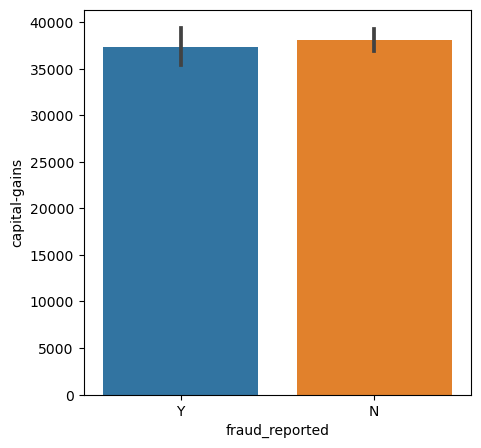

In [137]:
#Bar Plot for comparision between "capital-gains" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="capital-gains",data=fraud, x='fraud_reported')

not fraud_reported is little higher than fraud_reported for capital-gains

<AxesSubplot:xlabel='fraud_reported', ylabel='capital-loss'>

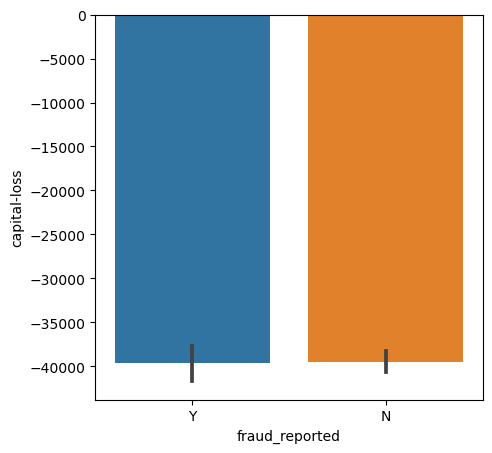

In [138]:
#Bar Plot for comparision between "capital-loss" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="capital-loss",data=fraud, x='fraud_reported')

capital-loss have equally fraud_reported and not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='incident_hour_of_the_day'>

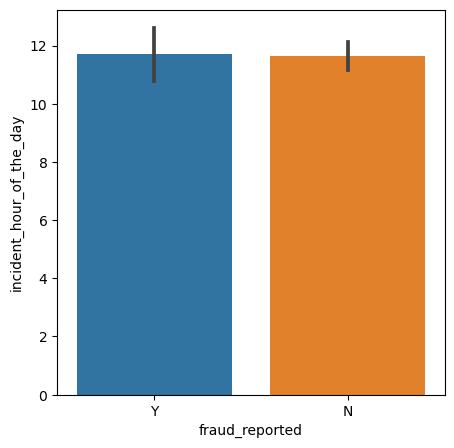

In [139]:
#Bar Plot for comparision between "incident_hour_of_the_day" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="incident_hour_of_the_day",data=fraud, x='fraud_reported')

fraud_reportedand not fraud_reported is equal for incident_hour_of_the_day

<AxesSubplot:xlabel='fraud_reported', ylabel='number_of_vehicles_involved'>

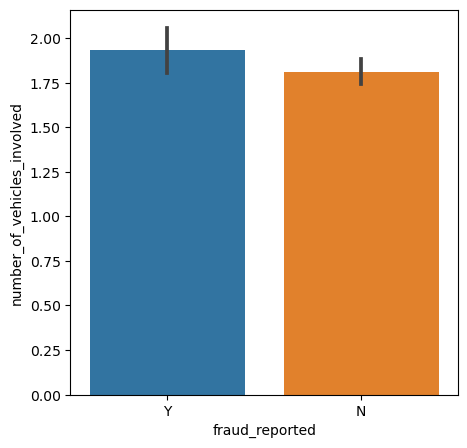

In [140]:
#Bar Plot for comparision between "number_of_vehicles_involved" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="number_of_vehicles_involved",data=fraud, x='fraud_reported')

fraud_reported is highest in number_of_vehicles_involved compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='bodily_injuries'>

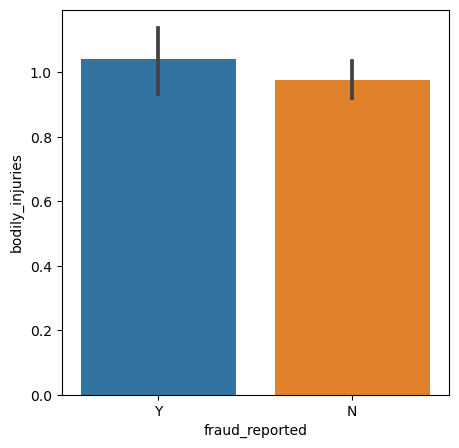

In [141]:
#Bar Plot for comparision between "bodily_injuries" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="bodily_injuries",data=fraud, x='fraud_reported')

fraud_reported is highest in bodily_injuries compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='witnesses'>

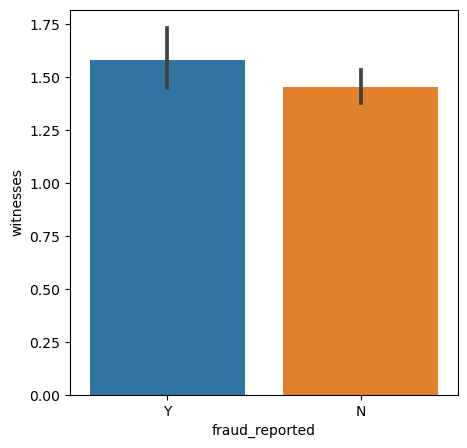

In [142]:
#Bar Plot for comparision between "witnesses" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="witnesses",data=fraud, x='fraud_reported')

fraud_reported is highest in witnesses compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='total_claim_amount'>

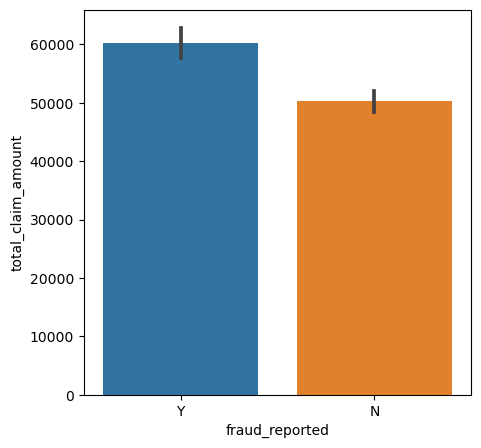

In [143]:
#Bar Plot for comparision between "total_claim_amount" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="total_claim_amount",data=fraud, x='fraud_reported')

fraud_reported is highest in total_claim_amount compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='injury_claim'>

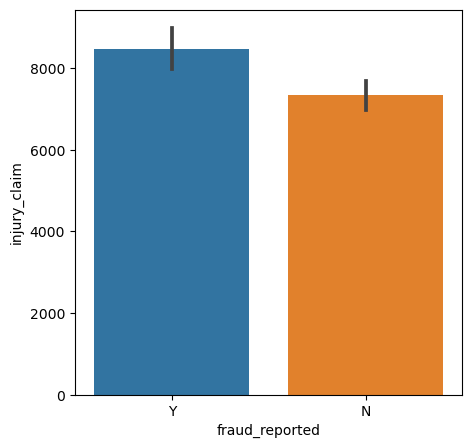

In [144]:
#Bar Plot for comparision between "injury_claim" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="injury_claim",data=fraud, x='fraud_reported')

fraud_reported is highest in injury_claim compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='property_claim'>

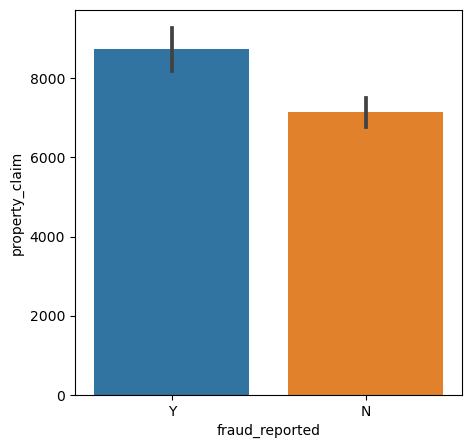

In [145]:
#Bar Plot for comparision between "property_claim" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="property_claim",data=fraud, x='fraud_reported')

fraud_reported is highest in property_claim compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='vehicle_claim'>

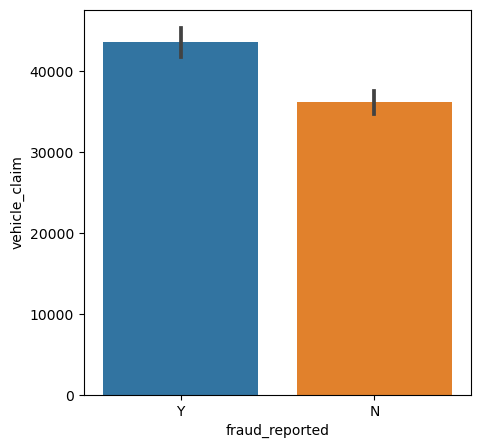

In [146]:
#Bar Plot for comparision between "vehicle_claim" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="vehicle_claim",data=fraud, x='fraud_reported')

fraud_reported is highest in vehicle_claim compare to not fraud_reported

<AxesSubplot:xlabel='fraud_reported', ylabel='auto_year'>

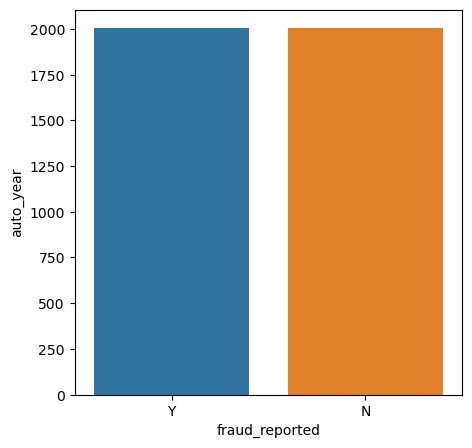

In [147]:
#Bar Plot for comparision between "auto_year" column and "fraud_reported" column
plt.figure(figsize=(5,5))
sns.barplot(y="auto_year",data=fraud, x='fraud_reported')

In auto_year fraud_reported and not fraud_reported is equal

# Multivariate Analysis

### Using Pairplot

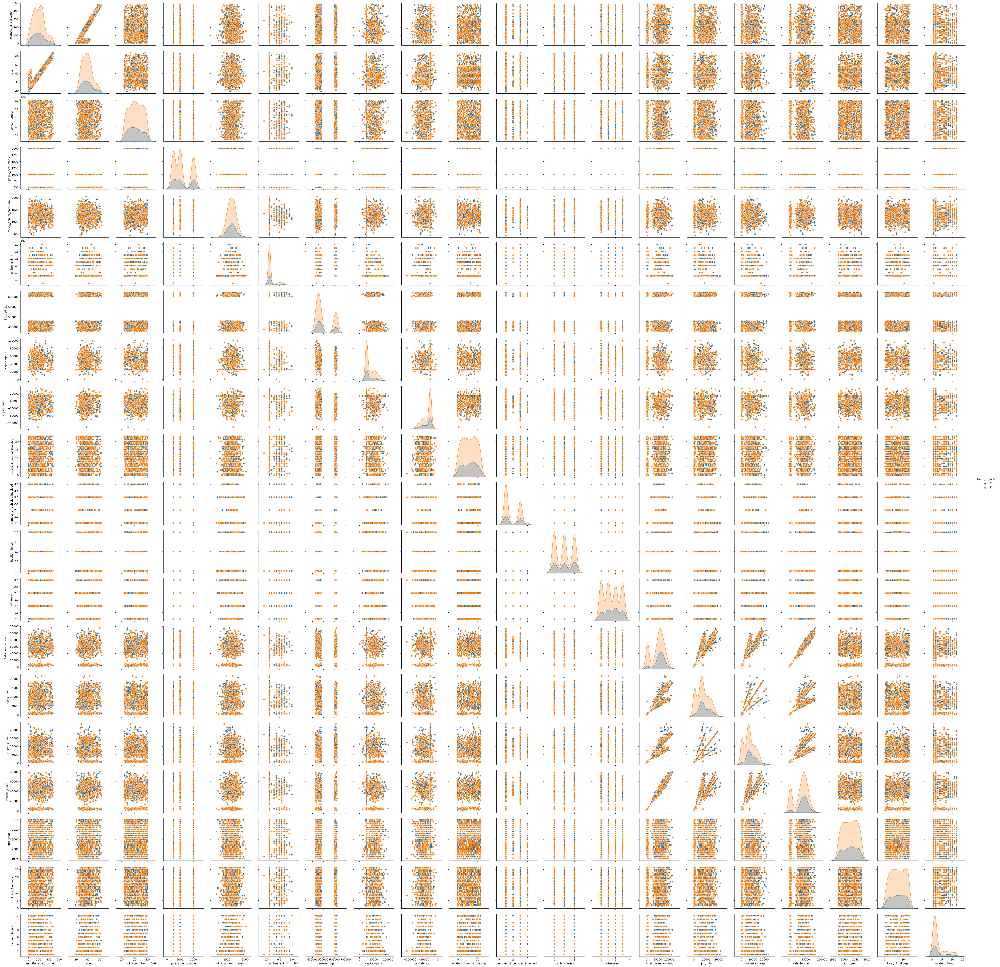

In [148]:
sns.pairplot(fraud,hue="fraud_reported")

#### Observations:

We can observe relationship between all the continuous column and the target column by this pairplot in pairs which are plotted on basis of target column.

### Droping irrelevant column

In [149]:
#these columns have unique value and not help in prediction
fraud.drop(columns=['policy_number','insured_zip','incident_location'],inplace=True)

In [150]:
fraud.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Age,Incident_Month
0,328,48,OH,250/500,1000,1406.91,1101000,MALE,MD,craft-repair,...,71610,6510.0,13020.0,52080,Saab,92x,2004,Y,2,1
1,228,42,IN,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,...,5070,780.0,780.0,3510,Mercedes,E400,2007,Y,10,1
2,134,29,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,...,34650,7700.0,3850.0,23100,Dodge,RAM,2007,N,16,2
3,256,41,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,...,63400,6340.0,6340.0,50720,Chevrolet,Tahoe,2014,Y,26,10
4,228,44,IL,500/1000,1000,1583.91,6000000,MALE,Associate,sales,...,6500,1300.0,650.0,4550,Accura,RSX,2009,N,2,2


### Label Encoding

In [151]:
enc = LabelEncoder()
for i in fraud.columns:
    if fraud[i].dtypes=="object":
        fraud[i]=enc.fit_transform(fraud[i].values.reshape(-1,1))

In [152]:
fraud.dtypes

months_as_customer               int64
age                              int64
policy_state                     int32
policy_csl                       int32
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_sex                      int32
insured_education_level          int32
insured_occupation               int32
insured_hobbies                  int32
insured_relationship             int32
capital-gains                  float64
capital-loss                   float64
incident_type                    int32
collision_type                   int32
incident_severity                int32
authorities_contacted            int32
incident_state                   int32
incident_city                    int32
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                  int32
bodily_injuries                  int64
witnesses                        int64
police_report_available  

### Checking dataset after transformation

In [153]:
fraud.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Age,Incident_Month
0,328,48,2,1,1000,1406.91,1101000,1,4,2,...,71610,6510.0,13020.0,52080,10,1,2004,1,2,1
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780.0,780.0,3510,8,12,2007,1,10,1
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700.0,3850.0,23100,4,30,2007,0,16,2
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340.0,6340.0,50720,3,34,2014,1,26,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300.0,650.0,4550,0,31,2009,0,2,2


### Checking Correlation

In [154]:
fraud.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Policy_Bind_Age,Incident_Month
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.017658,0.060925,-0.000833,0.009814,...,0.062108,0.070206,0.038711,0.061013,0.047655,0.004202,-0.000292,0.020544,0.048276,0.024659
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.022174,0.073337,0.000969,0.017220,...,0.069863,0.078958,0.062505,0.062588,0.030410,0.017343,0.001354,0.012143,0.037444,0.023404
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.032730,-0.020481,-0.034327,-0.031215,...,-0.006002,-0.035151,0.006210,0.001425,0.017124,-0.025253,0.002114,0.029432,0.007276,0.023643
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.023590,-0.010757,0.009153,0.015788,...,-0.055758,-0.098418,-0.039441,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,0.016466,-0.011794
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.014209,-0.009733,0.015217,-0.046733,...,0.022839,0.017460,0.060968,0.005269,-0.035379,-0.003268,0.026105,0.014817,0.049598,-0.006418
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.007658,0.038853,-0.019715,0.035922,...,0.009094,-0.028274,-0.019886,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.001249,0.021559
umbrella_limit,0.017658,0.022174,-0.032730,0.023590,0.014209,-0.007658,1.000000,0.008975,-0.018795,0.024223,...,-0.041842,-0.056582,-0.020354,-0.039964,-0.006983,0.042347,0.011482,0.057885,-0.045270,0.042185
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.008975,1.000000,0.009002,-0.006160,...,-0.023727,-0.007161,-0.020879,-0.029609,0.026457,-0.018421,-0.028247,0.030873,0.032891,0.024227
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.018795,0.009002,1.000000,-0.020298,...,0.074226,0.070595,0.062471,0.068348,0.055202,0.049445,0.043509,0.008808,-0.018952,0.075083
insured_occupation,0.009814,0.017220,-0.031215,0.015788,-0.046733,0.035922,0.024223,-0.006160,-0.020298,1.000000,...,0.003692,0.021887,0.011909,-0.000829,0.042621,0.020584,-0.006676,0.001564,0.027085,0.019403


#### Observations:

This gives the correlation between the denpendent and independent variables.

In [155]:
fraud.corr()["fraud_reported"].sort_values()

incident_severity             -0.405988
collision_type                -0.135725
incident_state                -0.051407
incident_type                 -0.050376
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_city                 -0.040403
policy_csl                    -0.037190
auto_make                     -0.027519
capital-gains                 -0.019227
policy_annual_premium         -0.014480
capital-loss                  -0.005125
Policy_Bind_Age                0.000059
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
police_report_available        0.008399
insured_education_level        0.008808
age                            0.012143
Incident_Month                 0.014495
policy_deductable              0.014817
months_as_customer             0.020544
insured_relationship           0.021043
policy_state                   0.029432


#### Observations:

1. All columns are sorted in ascending order showing least to strong correlation with target column.
2. 14 columns are negatively correlated and 25 columns are positively correlated.
3. Column 'vehicle_claim' is highly correlated with Target column and Column 'incident_severity' is least correlated with Target column

### Checking correlation with heatmap

<AxesSubplot:>

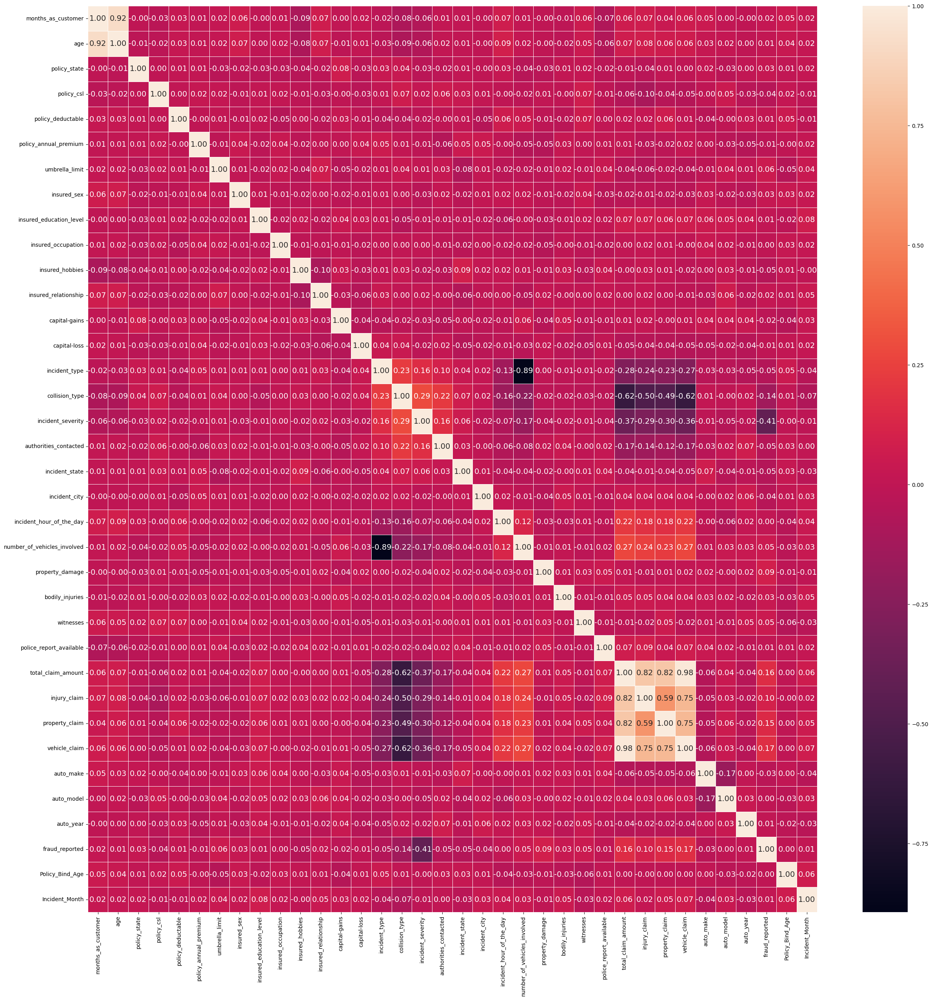

In [156]:
plt.figure(figsize=(30,30))
sns.heatmap(fraud.corr(),annot=True,annot_kws= {"size": 14}, linewidth=0.5, linecolor='white', fmt='.2f')

#### Outcome of Correlation

1. months_as_customer has 2 percent correlation with the target column which can be considered as good correlation and positively correlated.

2. age has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

3. policy_number has -3 percent correlation with the target column which can be considered as good correlation and negatively correlated.

4. policy_state has 3 percent correlation with the target column which can be considered as good correlation and positively correlated.

5. policy_csl has -4 percent correlation with the target column which can be considered as good correlation and positively correlated.

6. policy_deductable has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

7. policy_annual_premium has -1 percent correlation with the target column which can be considered as good correlation and positively correlated.

8. umbrella_limit has 6 percent correlation with the target column which can be considered as good correlation and positively correlated.

9. insured_zip has 2 percent correlation with the target column which can be considered as good correlation and positively correlated.

10. insured_sex has 3 percent correlation with the target column which can be considered as good correlation and positively correlated.

11. insured_education_level has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

12. insured_occupation has 0 percent correlation with the target column which can be considered as no correlation so we will drop this column.

13. insured_hobbies has -5 percent correlation with the target column which can be considered as good correlation and positively correlated.

14. insured_relationship has 2 percent correlation with the target column which can be considered as good correlation and positively correlated.

15. capital-gains has -2 percent correlation with the target column which can be considered as good correlation and positively correlated.

16. capital-loss has -1 percent correlation with the target column which can be considered as good correlation and positively correlated.

17. incident_type has -5 percent correlation with the target column which can be considered as good correlation and positively correlated.

18. collision_type has -14 percent correlation with the target column which can be considered as good correlation and positively correlated.

19. incident_severity has -41 percent correlation with the target column which can be considered as weak correlation and positively correlated.

20. authorities_contacted has -5 percent correlation with the target column which can be considered as good correlation and positively correlated.

21. incident_state has -5 percent correlation with the target column which can be considered as good correlation and positively correlated.

22. incident_city has -4 percent correlation with the target column which can be considered as good correlation and positively correlated.

23. incident_location has -1 percent correlation with the target column which can be considered as good correlation and positively correlated.

24. incident_hour_of_the_day has 0 percent correlation with the target column which can be considered as no correlation so we will drop this column.

25. number_of_vehicles_involved has 5 percent correlation with the target column which can be considered as good correlation and positively correlated.

26. property_damage has 9 percent correlation with the target column which can be considered as good correlation and positively correlated.

27. bodily_injuries has 3 percent correlation with the target column which can be considered as good correlation and positively correlated.

28. witnesses has 5 percent correlation with the target column which can be considered as good correlation and positively correlated.

29. police_report_available has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

30. total_claim_amount has 16 percent correlation with the target column which can be considered as good correlation and positively correlated.

31. injury_claim has 15 percent correlation with the target column which can be considered as good correlation and positively correlated.

32. vehicle_claim has 17 percent correlation with the target column which can be considered as strong correlation and positively correlated.

33. auto_make has -3 percent correlation with the target column which can be considered as good correlation and positively correlated.

34. auto_model has 0 percent correlation with the target column which can be considered as no correlation so we will drop this column.

35. auto_year has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

36. Policy_Bind_Age has 0 percent correlation with the target column which can be considered as no correlation so we will drop this column.

37. Incident_Month has 1 percent correlation with the target column which can be considered as good correlation and positively correlated.

38. Max correlation is with vehicle_claim

39. Min correlation is with incident_severity

### Checking correlation with barplot

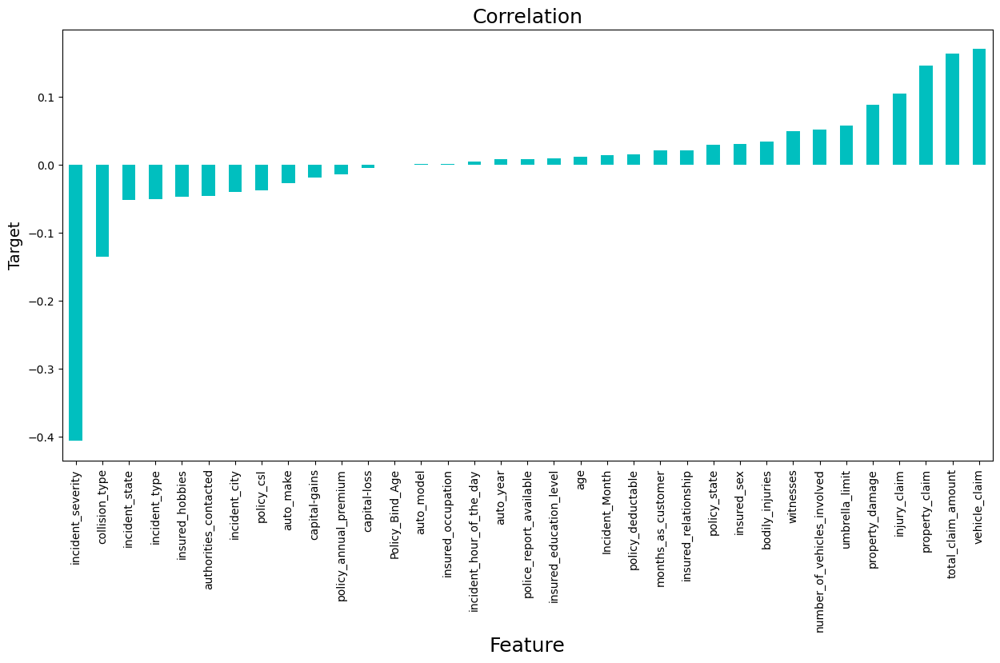

In [157]:
plt.figure(figsize=(15,7))
fraud.corr()['fraud_reported'].sort_values(ascending=True).drop(['fraud_reported']).plot(kind='bar',color='c')
plt.xlabel('Feature',fontsize=18)
plt.ylabel('Target',fontsize=14)
plt.title('Correlation',fontsize=18)
plt.show()

#### Observation:

1. Here also we can see there is no correlation between Policy_Bind_Age column and Target Column, fraud_reported. So we will drop this column.
2. We will not drop column "insured_occupation", "incident_hour_of_the_day", "auto_model" as these column are least correlated with Target column according to barplot observation.
3. Target column (fraud_reported) has Highest Positively Correlation is with vehicle_claim.
4. Target column (fraud_reported) has Highest Negatively Correlation is with incident_severity.

In [158]:
#Droping "Policy_Bind_Age" column from dataset because this column have no relation with our Target Column. 
fraud=fraud.drop(columns="Policy_Bind_Age", axis=1)

In [159]:
# checking dataset after droping column
fraud.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month
0,328,48,2,1,1000,1406.91,1101000,1,4,2,...,1,71610,6510.0,13020.0,52080,10,1,2004,1,1
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,2,5070,780.0,780.0,3510,8,12,2007,1,1
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,0,34650,7700.0,3850.0,23100,4,30,2007,0,2
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,0,63400,6340.0,6340.0,50720,3,34,2014,1,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,0,6500,1300.0,650.0,4550,0,31,2009,0,2


In [160]:
# checking again column name
fraud.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported', 'Incident_Month'],
      dtype='object')

In [161]:
#checking again total no of rows and columns
fraud.shape

(1000, 35)

### Checking Outliers

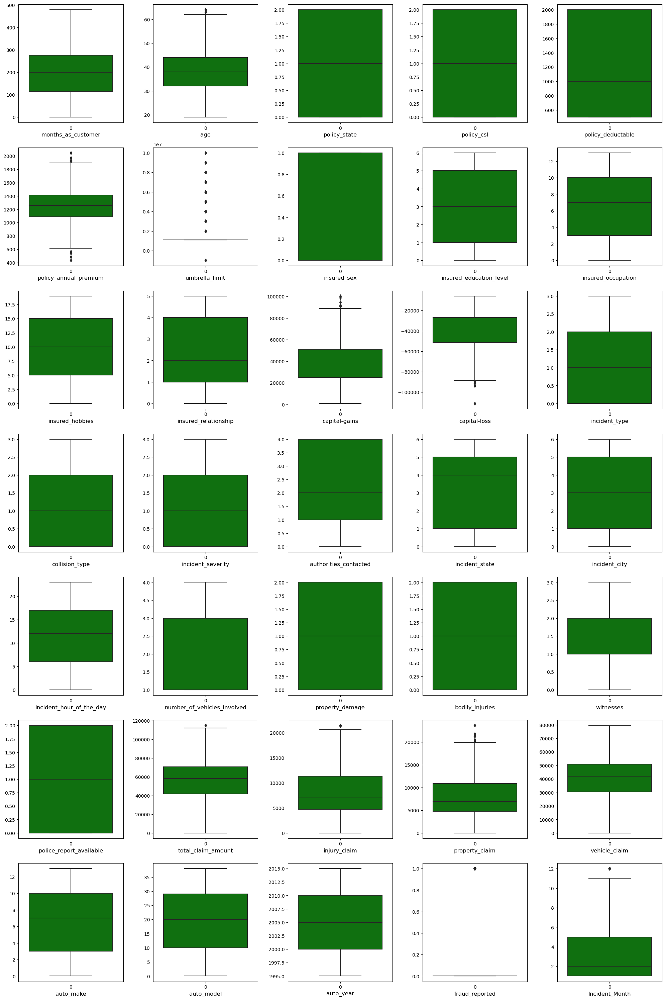

In [162]:
#collist=fraud.columns.values
plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in fraud:
    if plotnumber<=35:
        ax = plt.subplot(7,5,plotnumber)
        sns.boxplot(data=fraud[column],color='green',orient='v')
        plt.xlabel(column,fontsize=12)
    plotnumber+=1
plt.tight_layout()

#### Observation:

We can see outliers are present only in continuous columns.

1. Outliers present in columns: 'age', 'policy_annual_premium', 'umbrella_limit','capital-gains','capital-loss','total_claim_amount', 'injury_claim', 'property_claim', 'fraud_reported', 'Incident_Month'

2. Outliers not present in columns: 'months_as_customer', 'policy_state', 'policy_csl', 'policy_deductable', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship','incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses','police_report_available', 'vehicle_claim', 'auto_make', 'auto_model','auto_year'

### Removing Outliers

### 1. Zscore method using Scipy

In [163]:
# Outliers will be removed only from Continuous column variable i.e; 'age', 'policy_annual_premium', 'umbrella_limit','capital-gains','capital-loss' & 'total_claim_amount', 'injury_claim', 'property_claim','Incident_Month'. 
# We will not remove outliers from Target column i.e;  'fraud_reported'

variables = fraud[['age', 'policy_annual_premium', 'umbrella_limit','capital-gains','capital-loss','total_claim_amount', 'injury_claim', 'property_claim','Incident_Month']]
z=np.abs(zscore(variables))

# Creating new dataframe
fraud_detection = fraud[(z<3).all(axis=1)]
fraud_detection.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,Incident_Month
0,328,48,2,1,1000,1406.91,1101000,1,4,2,...,1,71610,6510.0,13020.0,52080,10,1,2004,1,1
1,228,42,1,1,2000,1197.22,5000000,1,4,6,...,2,5070,780.0,780.0,3510,8,12,2007,1,1
2,134,29,2,0,2000,1413.14,5000000,0,6,11,...,0,34650,7700.0,3850.0,23100,4,30,2007,0,2
3,256,41,0,1,2000,1415.74,6000000,0,6,1,...,0,63400,6340.0,6340.0,50720,3,34,2014,1,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,...,0,6500,1300.0,650.0,4550,0,31,2009,0,2


In [164]:
z.head()

,age,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,total_claim_amount,injury_claim,property_claim,Incident_Month
0,0.990836,0.616705,0.467397,0.901099,0.752472,0.714257,0.234457,1.163172,0.735040
1,0.334073,0.242521,1.606795,0.746385,0.752472,1.807312,1.445575,1.434938,0.735040
2,1.088913,0.642233,1.606795,0.163156,0.752472,0.686362,0.017067,0.783288,0.429664
3,0.224613,0.652886,2.138776,0.643807,1.352715,0.403135,0.270389,0.254751,2.013343
4,0.552994,1.341980,2.138776,1.643739,0.383082,1.753121,1.335665,1.462533,0.429664


In [165]:
print("Old DataFrame data in Rows and Column:",fraud.shape)
print("New DataFrame data in Rows and Column:",fraud_detection.shape)
print("Total Dropped rows:",fraud.shape[0]-fraud_detection.shape[0])

Old DataFrame data in Rows and Column: (1000, 35)
New DataFrame data in Rows and Column: (970, 35)
Total Dropped rows: 30


### Percentage Data Loss using Zscore

In [166]:
loss_percent=(1000-970)/1000*100
print(loss_percent,"%")

3.0 %


### 2. IQR (Inter Quantile Range) method

In [167]:
#1st quantile
Q1=variables.quantile(0.25)

# 3rd quantile
Q3=variables.quantile(0.75)

#IQR
IQR=Q3 - Q1
fraud_detect=fraud[~((fraud < (Q1 - 1.5 * IQR)) |(fraud > (Q3 + 1.5 * IQR))).any(axis=1)]

In [168]:
print("Old DataFrame data in Rows and Column:",fraud.shape)
print("\nNew DataFrame data in Rows and Column:",fraud_detect.shape)
print("\nTotal Dropped rows:",fraud.shape[0]-fraud_detect.shape[0])

Old DataFrame data in Rows and Column: (1000, 35)

New DataFrame data in Rows and Column: (737, 35)

Total Dropped rows: 263


### Percentage Data Loss using IQR

In [169]:
loss_perc = (1000-737)/1000*100
loss_perc

26.3

#### Observations:

We can check by using IQR method there is large data loss in comparision to Zscore method. So, we will consider Zscore method.

### Checking Skewness

In [170]:
fraud_detection.skew()

months_as_customer             0.362223
age                            0.477395
policy_state                  -0.044333
policy_csl                     0.097346
policy_deductable              0.479058
policy_annual_premium          0.044323
umbrella_limit                 1.890782
insured_sex                    0.136610
insured_education_level        0.011899
insured_occupation            -0.063436
insured_hobbies               -0.063716
insured_relationship           0.069920
capital-gains                  0.943831
capital-loss                  -0.932941
incident_type                  0.085481
collision_type                 0.129939
incident_severity              0.271101
authorities_contacted         -0.116543
incident_state                -0.141274
incident_city                  0.039395
incident_hour_of_the_day      -0.043900
number_of_vehicles_involved    0.513830
property_damage               -0.046410
bodily_injuries                0.001897
witnesses                      0.023900


#### Observation:

1. Skewness threshold taken is +/-0.25
2. All the columns are not normallly distributed, they are skewed.
3. Columns which are having skewness: months_as_customer, age, policy_deductable, umbrella_limit, capital-gains, capital-loss, incident_severity, number_of_vehicles_involved, total_claim_amount, injury_claim, property_claim, vehicle_claim, Incident_Month.
4. The capital-loss column data is negatively highly skewed and umbrella_limit is positively highly skewed
5. Since incident_severity is categorical column so we will not remove skewness and fraud_reported is Target Column so we will not remove skewness.
6. So we will remove skewness from months_as_customer, age, policy_deductable, umbrella_limit, capital-gains, capital-loss, number_of_vehicles_involved, total_claim_amount, injury_claim, property_claim, vehicle_claim, Incident_Month as these columns contain continuous data.

### Checking skweness through Data Visualization also

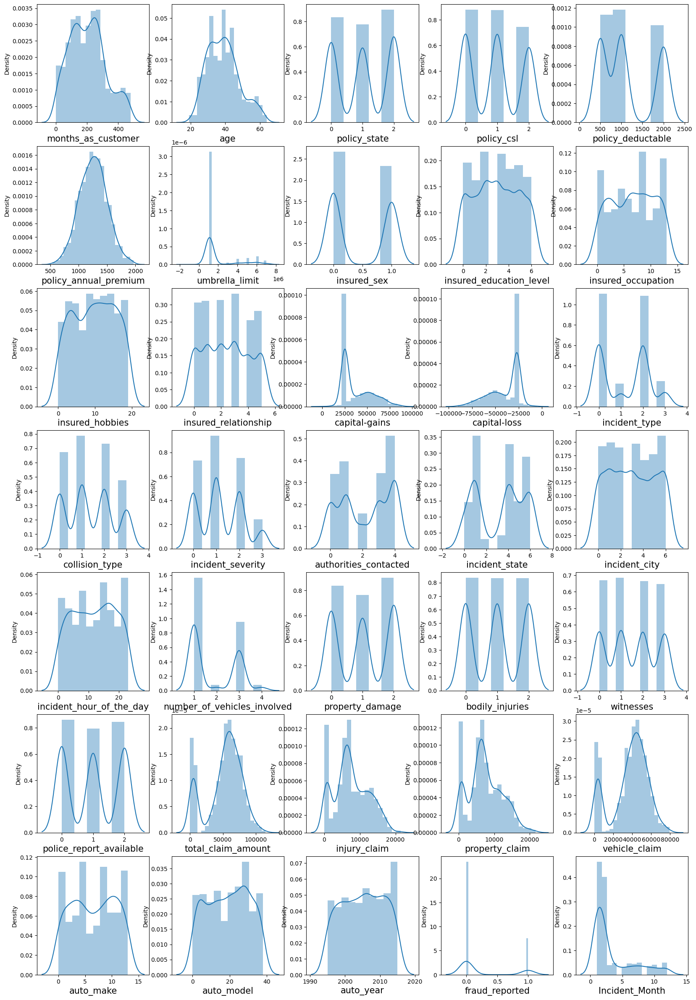

In [171]:
plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in fraud_detection:
    if plotnumber<=35:
        ax = plt.subplot(7,5,plotnumber)
        sns.distplot(fraud_detection[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

#### Observations:

We can see skewness is present in all columns.

### Removing skewness using yeo-johnson method

In [172]:
collist=['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',  'Incident_Month']
fraud_detection[collist]=power_transform(fraud_detection[collist],method='yeo-johnson')
fraud_detection[collist]

,months_as_customer,age,policy_deductable,umbrella_limit,capital-gains,capital-loss,number_of_vehicles_involved,total_claim_amount,injury_claim,property_claim,vehicle_claim,Incident_Month
0,1.041996,1.000805,0.063749,-0.449266,1.032816,0.752287,-0.836244,0.722144,-0.092989,1.120326,0.759575,-1.103235
1,0.298095,0.426980,1.273647,1.818253,-0.754778,0.752287,-0.836244,-1.775394,-1.641224,-1.649355,-1.784536,-1.103235
2,-0.515153,-1.133360,1.273647,1.818253,0.028319,0.752287,1.201438,-0.711033,0.145358,-0.679337,-0.814721,-0.019972
3,0.516118,0.324046,1.273647,2.371309,0.823241,-1.353674,-0.836244,0.397987,-0.128244,-0.107227,0.683595,1.560775
4,0.298095,0.626232,0.063749,2.371309,1.558121,-0.633846,-0.836244,-1.727850,-1.435839,-1.709177,-1.737543,-0.019972
...,...,...,...,...,...,...,...,...,...,...,...,...
995,-2.290154,0.000732,0.063749,-0.449266,-0.754778,0.752287,-0.836244,1.344673,1.761313,0.367243,1.264116,-0.019972
996,0.733396,0.324046,0.063749,-0.449266,1.735901,0.752287,-0.836244,2.206885,1.854188,1.899631,1.908056,-1.103235
997,-0.553534,-0.469015,-1.216422,0.684676,0.028319,0.752287,1.201438,0.559524,0.106257,0.130741,0.783073,-1.103235
998,1.899600,2.116517,1.273647,1.818253,-0.754778,0.752287,-0.836244,-0.241131,-0.369478,-0.352242,-0.097610,-0.019972


### checking skewness after removal

In [173]:
fraud_detection.skew()

months_as_customer            -0.134939
age                           -0.002106
policy_state                  -0.044333
policy_csl                     0.097346
policy_deductable              0.022243
policy_annual_premium          0.044323
umbrella_limit                 1.597850
insured_sex                    0.136610
insured_education_level        0.011899
insured_occupation            -0.063436
insured_hobbies               -0.063716
insured_relationship           0.069920
capital-gains                  0.031710
capital-loss                   0.016884
incident_type                  0.085481
collision_type                 0.129939
incident_severity              0.271101
authorities_contacted         -0.116543
incident_state                -0.141274
incident_city                  0.039395
incident_hour_of_the_day      -0.043900
number_of_vehicles_involved    0.379938
property_damage               -0.046410
bodily_injuries                0.001897
witnesses                      0.023900


#### Observations:

Still we can see skewness is present in umbrella_limit, number_of_vehicles_involved, total_claim_amount, vehicle_claim & Incident_Month

### checking skewness after removal through data visualization using distplot

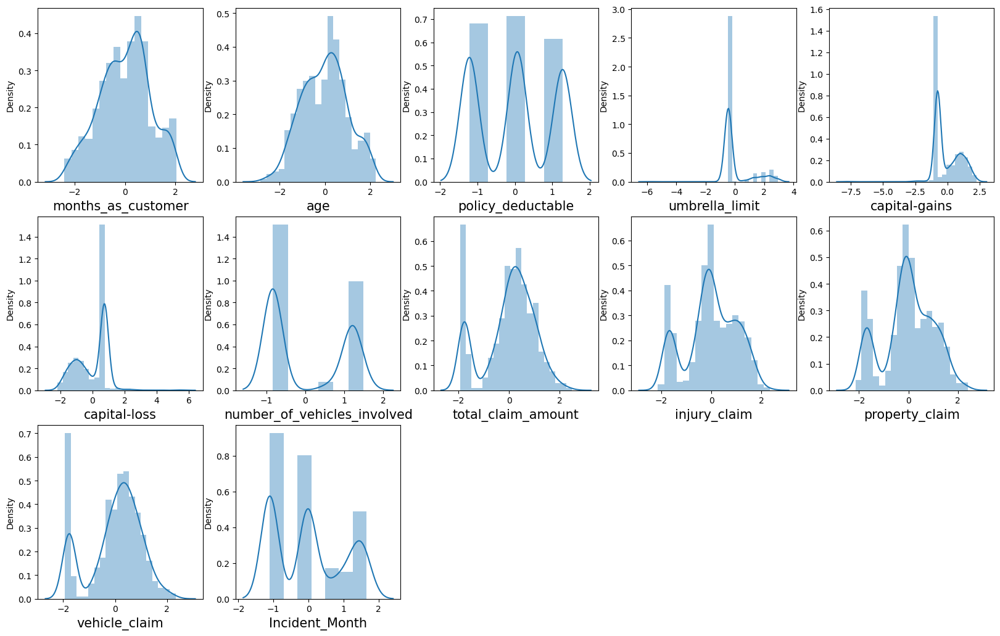

In [174]:
collist=['months_as_customer', 'age', 'policy_deductable', 'umbrella_limit', 'capital-gains', 'capital-loss', 'number_of_vehicles_involved', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim',  'Incident_Month']

plt.figure(figsize=(20,30), facecolor='white')
plotnumber = 1

for column in fraud_detection[collist]:
    if plotnumber<=35:
        ax = plt.subplot(7,5,plotnumber)
        sns.distplot(fraud_detection[column])
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

#### Observations:

The data is not normal and the skewness is still present in some columns.

### Data preprocessing

### Spliting data into Target and Features:

In [175]:
x=fraud_detection.drop("fraud_reported",axis=1)
y=fraud_detection["fraud_reported"]

In [176]:
x.columns

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'Incident_Month'],
      dtype='object')

In [177]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month
0,1.041996,1.000805,2,1,0.063749,1406.91,-0.449266,1,4,2,...,2,1,0.722144,-0.092989,1.120326,0.759575,10,1,2004,-1.103235
1,0.298095,0.426980,1,1,1.273647,1197.22,1.818253,1,4,6,...,0,2,-1.775394,-1.641224,-1.649355,-1.784536,8,12,2007,-1.103235
2,-0.515153,-1.133360,2,0,1.273647,1413.14,1.818253,0,6,11,...,3,0,-0.711033,0.145358,-0.679337,-0.814721,4,30,2007,-0.019972
3,0.516118,0.324046,0,1,1.273647,1415.74,2.371309,0,6,1,...,2,0,0.397987,-0.128244,-0.107227,0.683595,3,34,2014,1.560775
4,0.298095,0.626232,0,2,0.063749,1583.91,2.371309,1,0,11,...,1,0,-1.727850,-1.435839,-1.709177,-1.737543,0,31,2009,-0.019972


In [178]:
y.head()

0    1
1    1
2    0
3    1
4    0
Name: fraud_reported, dtype: int32

In [179]:
x.shape, y.shape

((970, 34), (970,))

In [180]:
y.value_counts()

0    733
1    237
Name: fraud_reported, dtype: int64

#### Observations:

The data is not balanced. So, we will use oversampling method to balance it.

### Oversampling using the SMOTE

In [181]:
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

In [182]:
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [183]:
y.value_counts()

1    733
0    733
Name: fraud_reported, dtype: int64

#### Observations:

After using oversampling method, we check that now our data is balanced.

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

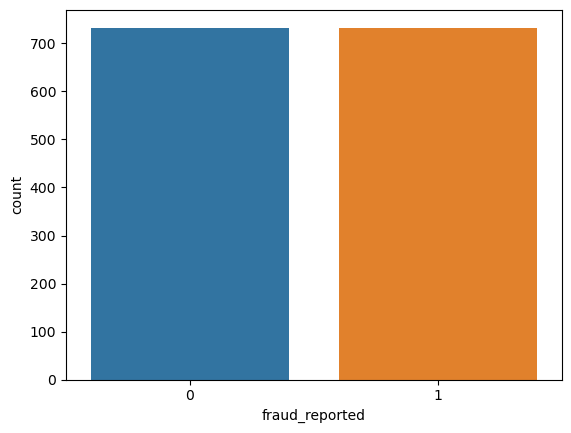

In [184]:
#checking through visualization also
sns.countplot(y)

#### Observations:

Now, our data is balanced.

### Scaling data using Standard Scaler

In [186]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [187]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month
0,1.105649,1.054504,1.348299,0.238608,0.069230,0.647677,-0.524825,1.283047,0.623526,-1.193922,...,0.573358,0.131957,0.694295,-0.164751,1.121789,0.721352,0.954764,-1.701503,-0.159325,-1.153490
1,0.320284,0.457142,0.077986,0.238608,1.345521,-0.218103,1.839235,1.283047,0.623526,-0.148349,...,-1.317628,1.396329,-2.054326,-1.879724,-1.888658,-2.065223,0.430734,-0.670835,0.360105,-1.153490
2,-0.538293,-1.167199,1.348299,-1.076426,1.345521,0.673399,1.839235,-0.779395,1.712375,1.158618,...,1.518851,-1.132415,-0.882962,0.099265,-0.834318,-1.002981,-0.617326,1.015712,0.360105,-0.033185
3,0.550459,0.349986,-1.192326,0.238608,1.345521,0.684134,2.415837,-0.779395,1.712375,-1.455315,...,0.573358,-1.132415,0.337550,-0.203803,-0.212474,0.638130,-0.879341,1.390501,1.572106,1.601615
4,0.320284,0.664567,-1.192326,1.553641,0.069230,1.378484,2.415837,1.283047,-1.554172,1.158618,...,-0.372135,-1.132415,-2.002002,-1.652220,-1.953681,-2.013752,-1.665385,1.109409,0.706391,-0.033185


### Variance Threshold Method

It removes all features which variance doesn't meet some threshold. By default, it removes all zero-variance features.

In [188]:
var_threshold = VarianceThreshold(threshold=0)
var_threshold.fit(x)

VarianceThreshold(threshold=0)

In [189]:
var_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True])

In [190]:
x.columns[var_threshold.get_support()]

Index(['months_as_customer', 'age', 'policy_state', 'policy_csl',
       'policy_deductable', 'policy_annual_premium', 'umbrella_limit',
       'insured_sex', 'insured_education_level', 'insured_occupation',
       'insured_hobbies', 'insured_relationship', 'capital-gains',
       'capital-loss', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'Incident_Month'],
      dtype='object')

In [191]:
# taking  out  all the  constant  columns 
cons_columns = [column for column in x.columns
               if column not in x.columns[var_threshold.get_support()]]
print(len(cons_columns))

0


#### Observations:

So we can see that, with the help of variance threshold method, we got to know all the features here are important. So now we will check through SelectKBest method.

### SelectKBest method

In [192]:
from sklearn.feature_selection import  SelectKBest, f_classif

In [193]:
best_fit = SelectKBest(score_func = f_classif, k ='all')
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [194]:
fit = best_fit.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(35,'Score'))

                        Feature       Score
16            incident_severity  647.700960
15               collision_type  117.232915
29                vehicle_claim   70.349318
26           total_claim_amount   60.557350
28               property_claim   55.222261
3                    policy_csl   53.861247
7                   insured_sex   42.949345
14                incident_type   29.453073
19                incident_city   28.343090
27                 injury_claim   26.785519
18               incident_state   22.227041
25      police_report_available   21.975121
17        authorities_contacted   19.861909
23              bodily_injuries   15.582326
10              insured_hobbies   14.597196
2                  policy_state   10.633825
6                umbrella_limit    9.466742
30                    auto_make    8.375827
11         insured_relationship    5.034018
24                    witnesses    3.810420
8       insured_education_level    2.962081
13                 capital-loss 

Selecting the best features based on above scores, we can see that the column "policy_deductable" has most lowest features for the prediction, so we will drop this column.

In [195]:
x = x.drop([ "policy_deductable"],axis=1)

In [196]:
x.shape

(1466, 33)

In [197]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month
0,1.105649,1.054504,1.348299,0.238608,0.647677,-0.524825,1.283047,0.623526,-1.193922,1.405913,...,0.573358,0.131957,0.694295,-0.164751,1.121789,0.721352,0.954764,-1.701503,-0.159325,-1.153490
1,0.320284,0.457142,0.077986,0.238608,-0.218103,1.839235,1.283047,0.623526,-0.148349,1.036215,...,-1.317628,1.396329,-2.054326,-1.879724,-1.888658,-2.065223,0.430734,-0.670835,0.360105,-1.153490
2,-0.538293,-1.167199,1.348299,-1.076426,0.673399,1.839235,-0.779395,1.712375,1.158618,-1.366825,...,1.518851,-1.132415,-0.882962,0.099265,-0.834318,-1.002981,-0.617326,1.015712,0.360105,-0.033185
3,0.550459,0.349986,-1.192326,0.238608,0.684134,2.415837,-0.779395,1.712375,-1.455315,-1.366825,...,0.573358,-1.132415,0.337550,-0.203803,-0.212474,0.638130,-0.879341,1.390501,1.572106,1.601615
4,0.320284,0.664567,-1.192326,1.553641,1.378484,2.415837,1.283047,-1.554172,1.158618,-1.366825,...,-0.372135,-1.132415,-2.002002,-1.652220,-1.953681,-2.013752,-1.665385,1.109409,0.706391,-0.033185


Now, we have completed features selection process through using 2 techniques. So, will check for multicolinearity now.

### Checking for Multicolinearity

### VIF (Variance Inflation factor)

In [198]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,5.190262,months_as_customer
1,5.235490,age
2,1.045474,policy_state
3,1.073753,policy_csl
4,1.052737,policy_annual_premium
5,1.031457,umbrella_limit
6,1.069398,insured_sex
7,1.047545,insured_education_level
8,1.034644,insured_occupation
9,1.068909,insured_hobbies


The VIF value is more than 10 in the columns 'total_claim_amount' and 'vehicle_claim'. But column 'total_claim_amount' is having highest VIF value. So, we will drop column 'total_claim_amount'.

In [199]:
x.drop('total_claim_amount', axis =1, inplace=True)

In [200]:
x.head()

,months_as_customer,age,policy_state,policy_csl,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Incident_Month
0,1.105649,1.054504,1.348299,0.238608,0.647677,-0.524825,1.283047,0.623526,-1.193922,1.405913,...,0.125235,0.573358,0.131957,-0.164751,1.121789,0.721352,0.954764,-1.701503,-0.159325,-1.153490
1,0.320284,0.457142,0.077986,0.238608,-0.218103,1.839235,1.283047,0.623526,-0.148349,1.036215,...,-1.149730,-1.317628,1.396329,-1.879724,-1.888658,-2.065223,0.430734,-0.670835,0.360105,-1.153490
2,-0.538293,-1.167199,1.348299,-1.076426,0.673399,1.839235,-0.779395,1.712375,1.158618,-1.366825,...,1.400201,1.518851,-1.132415,0.099265,-0.834318,-1.002981,-0.617326,1.015712,0.360105,-0.033185
3,0.550459,0.349986,-1.192326,0.238608,0.684134,2.415837,-0.779395,1.712375,-1.455315,-1.366825,...,0.125235,0.573358,-1.132415,-0.203803,-0.212474,0.638130,-0.879341,1.390501,1.572106,1.601615
4,0.320284,0.664567,-1.192326,1.553641,1.378484,2.415837,1.283047,-1.554172,1.158618,-1.366825,...,-1.149730,-0.372135,-1.132415,-1.652220,-1.953681,-2.013752,-1.665385,1.109409,0.706391,-0.033185


### Checking again Multicolinearity using VIF

In [201]:
vif = pd.DataFrame()
vif['VIF values']= [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF values,Features
0,5.179797,months_as_customer
1,5.208104,age
2,1.044207,policy_state
3,1.072447,policy_csl
4,1.052034,policy_annual_premium
5,1.031261,umbrella_limit
6,1.069398,insured_sex
7,1.045260,insured_education_level
8,1.033642,insured_occupation
9,1.066349,insured_hobbies


Now, we can check Multicolinearity is removed from the columns as VIF value of all columns are less than 10. So, we will create model now.

# Creating Model

### Finding the best random state among all the models

In [202]:
maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = DecisionTreeClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8522727272727273  on Random_state  31


#### At random state 51, we are getting best accuracy score i.e., 85%

### Creating train-test-split

In [203]:
# creating new train test split using the random state.
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [204]:
x.shape, y.shape

((1466, 32), (1466,))

In [205]:
x_train.shape,y_train.shape, x_test.shape,y_test.shape

((1026, 32), (1026,), (440, 32), (440,))

#### Observations:

We can see the x.shape value is divided into x_train.shape and x_test.shape and like this y.shape is also divided. We will understand this by Classification problem.

### Logistic Regression

In [206]:
lr=LogisticRegression()
lr.fit(x_train,y_train)
pred_lr=lr.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_lr))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_lr))
print("classification_report: \n", classification_report(y_test,pred_lr))

accuracy_score:  0.8159090909090909
confusion_matrix: 
 [[170  37]
 [ 44 189]]
classification_report: 
               precision    recall  f1-score   support

           0       0.79      0.82      0.81       207
           1       0.84      0.81      0.82       233

    accuracy                           0.82       440
   macro avg       0.82      0.82      0.82       440
weighted avg       0.82      0.82      0.82       440



#### Here we are getting 81% accuracy using Logistic Regression.

### Confusion Matrix for Logistic Regression

Text(0.5, 1.0, 'Logistic regressor prediction Confusion_matrix')

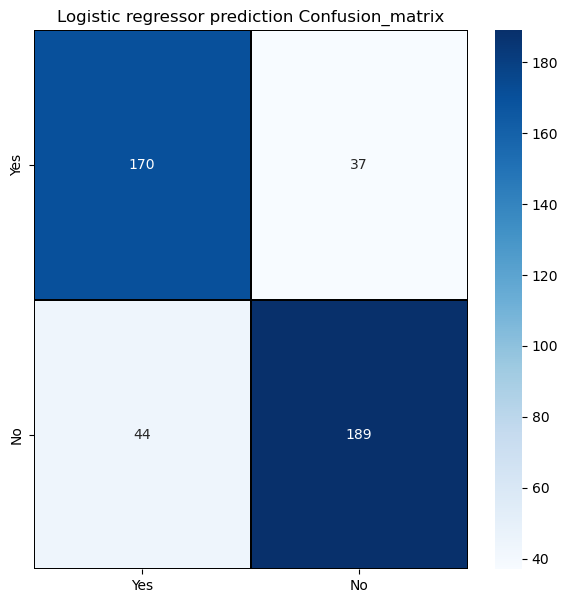

In [207]:
cm = confusion_matrix(y_test,pred_lr)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Logistic regressor prediction Confusion_matrix")

# Classification Algorithms

### Random Forest Classifier

In [208]:
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(x_train,y_train)
pred_rfc = rfc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_rfc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_rfc))
print("classification_report: \n",classification_report(y_test,pred_rfc))

accuracy_score:  0.9022727272727272
confusion_matrix: 
 [[191  16]
 [ 27 206]]
classification_report: 
               precision    recall  f1-score   support

           0       0.88      0.92      0.90       207
           1       0.93      0.88      0.91       233

    accuracy                           0.90       440
   macro avg       0.90      0.90      0.90       440
weighted avg       0.90      0.90      0.90       440



### Confusion Matrix for RFC

Text(0.5, 1.0, 'RFC prediction Confusion_matrix')

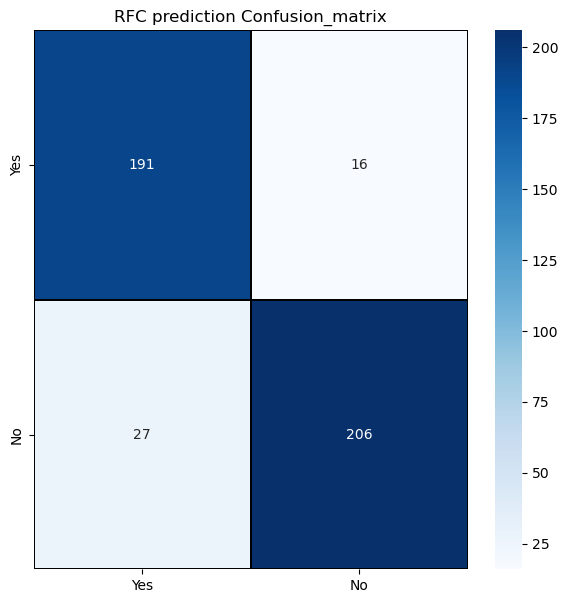

In [209]:
cm = confusion_matrix(y_test,pred_rfc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("RFC prediction Confusion_matrix")

### Decision Tree Classifier

In [210]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
pred_dtc = dtc.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_dtc))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_dtc))
print("classification_report: \n",classification_report(y_test,pred_dtc))

accuracy_score:  0.85
confusion_matrix: 
 [[179  28]
 [ 38 195]]
classification_report: 
               precision    recall  f1-score   support

           0       0.82      0.86      0.84       207
           1       0.87      0.84      0.86       233

    accuracy                           0.85       440
   macro avg       0.85      0.85      0.85       440
weighted avg       0.85      0.85      0.85       440



Here we are getting 85% accuracy using DTC.

### Confusion Matrix for DTC

Text(0.5, 1.0, 'DTC prediction Confusion_matrix')

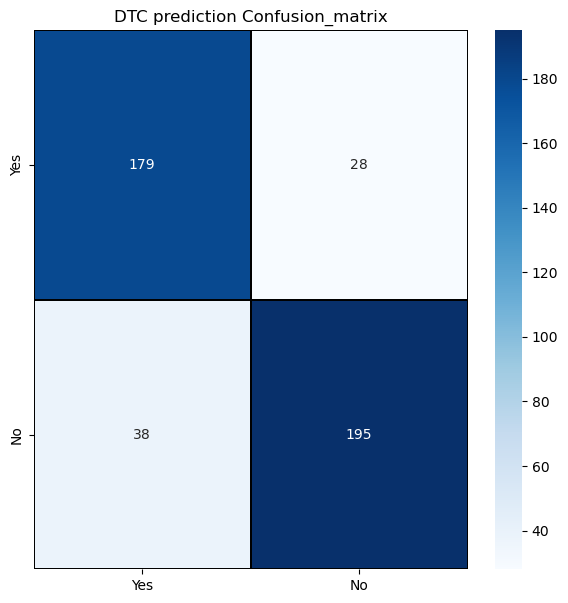

In [211]:
cm = confusion_matrix(y_test,pred_dtc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("DTC prediction Confusion_matrix")

### Support Vector Machine Classifier

In [212]:
svc = SVC(kernel='linear', gamma=3)
svc.fit(x_train,y_train)
pred_svc = svc.predict(x_test)

print("accuracy_score: ", accuracy_score(y_test, pred_svc))
print("confusion_matrix: \n", confusion_matrix(y_test, pred_svc))
print("classification_report: \n", classification_report(y_test,pred_svc))

accuracy_score:  0.8113636363636364
confusion_matrix: 
 [[169  38]
 [ 45 188]]
classification_report: 
               precision    recall  f1-score   support

           0       0.79      0.82      0.80       207
           1       0.83      0.81      0.82       233

    accuracy                           0.81       440
   macro avg       0.81      0.81      0.81       440
weighted avg       0.81      0.81      0.81       440



Here we are getting 81% accuracy using SVC.

### Confusion Matrix for SVC

Text(0.5, 1.0, 'SVC prediction Confusion_matrix')

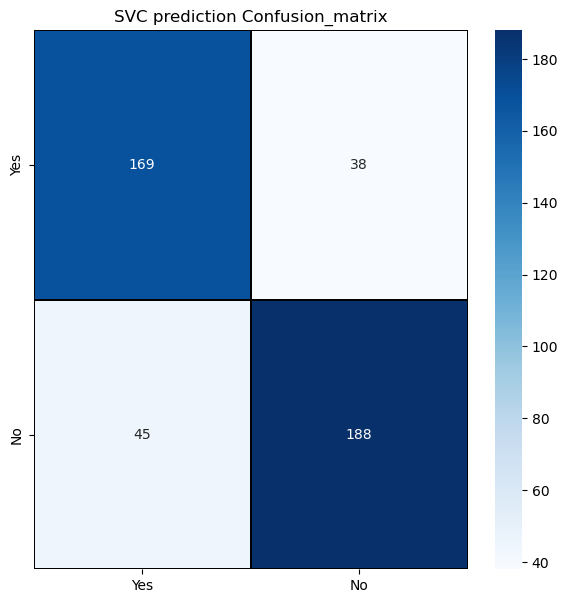

In [213]:
cm = confusion_matrix(y_test,pred_svc)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("SVC prediction Confusion_matrix")

### KNN Classifier

In [214]:
knn = KNN()
knn.fit(x_train,y_train)
pred_knn = knn.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_knn))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_knn))
print("classification_report: \n",classification_report(y_test,pred_knn))

accuracy_score:  0.7068181818181818
confusion_matrix: 
 [[ 87 120]
 [  9 224]]
classification_report: 
               precision    recall  f1-score   support

           0       0.91      0.42      0.57       207
           1       0.65      0.96      0.78       233

    accuracy                           0.71       440
   macro avg       0.78      0.69      0.68       440
weighted avg       0.77      0.71      0.68       440



Here we are getting 70% accuracy using KNN

### Confusion Matrix for KNN

Text(0.5, 1.0, 'KNN prediction Confusion_matrix')

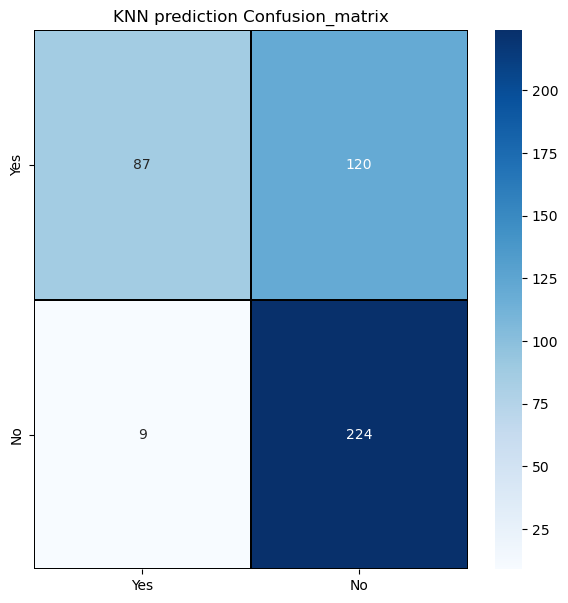

In [215]:
cm = confusion_matrix(y_test,pred_knn)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("KNN prediction Confusion_matrix")

### Gradient Boosting Classifier

In [216]:
gb = GradientBoostingClassifier(n_estimators =100,learning_rate=0.1, max_depth=4)
gb.fit(x_train,y_train)
pred_gb = gb.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_gb))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_gb))
print("classification_report: \n",classification_report(y_test,pred_gb))

accuracy_score:  0.9
confusion_matrix: 
 [[183  24]
 [ 20 213]]
classification_report: 
               precision    recall  f1-score   support

           0       0.90      0.88      0.89       207
           1       0.90      0.91      0.91       233

    accuracy                           0.90       440
   macro avg       0.90      0.90      0.90       440
weighted avg       0.90      0.90      0.90       440



Here we are getting 90% accuracy using Gradient Boosting classifier.

### Confusion Matrix for Gradient Boosting classifier

Text(0.5, 1.0, 'Gradient Boosting classifier prediction Confusion_matrix')

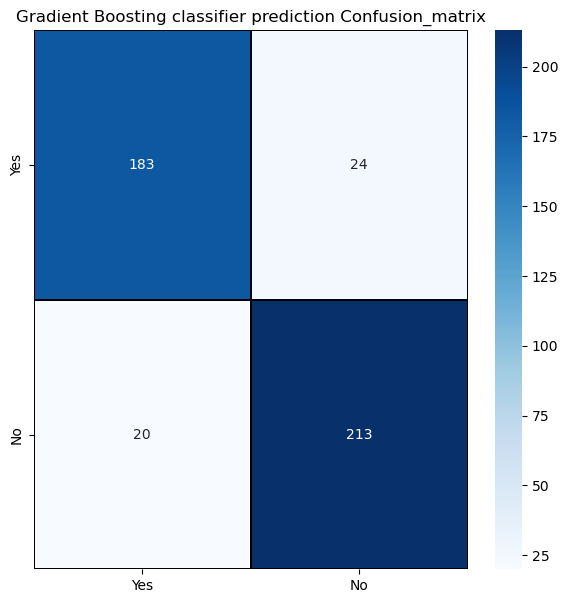

In [217]:
cm = confusion_matrix(y_test,pred_gb)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("Gradient Boosting classifier prediction Confusion_matrix")

### XGB Classifier

In [218]:
XGBC= XGBClassifier()
XGBC.fit(x_train,y_train)
pred_XGBC = XGBC.predict(x_test)

print("accuracy_score: ",accuracy_score(y_test, pred_XGBC))
print("confusion_matrix: \n",confusion_matrix(y_test, pred_XGBC))
print("classification_report: \n",classification_report(y_test,pred_XGBC))

accuracy_score:  0.9159090909090909
confusion_matrix: 
 [[186  21]
 [ 16 217]]
classification_report: 
               precision    recall  f1-score   support

           0       0.92      0.90      0.91       207
           1       0.91      0.93      0.92       233

    accuracy                           0.92       440
   macro avg       0.92      0.91      0.92       440
weighted avg       0.92      0.92      0.92       440



Here we are getting 91% accuracy using XGB Classifier

### Confusion Matrix for XGB Classifier

Text(0.5, 1.0, 'XGB Classifier prediction Confusion_matrix')

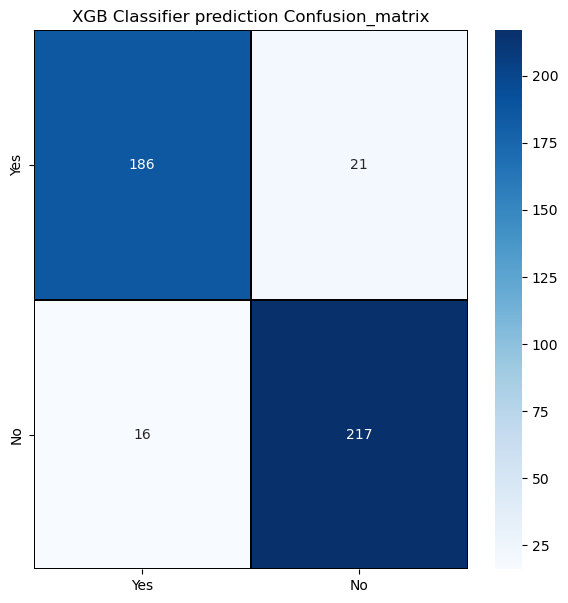

In [219]:
cm = confusion_matrix(y_test,pred_XGBC)
x_axis_labels = ["Yes","No"]
y_axis_labels = ["Yes","No"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", 
xticklabels=x_axis_labels,
yticklabels=y_axis_labels)
plt.title("XGB Classifier prediction Confusion_matrix")

### Cross Validation Score for all the model

In [220]:
#CV Score for Logistic Regression
print('CV score for Logistic Regression: ',cross_val_score(lr,x,y,cv=5).mean())

#CV Score for Random Forest Classifier
print('CV score for Random forest Classifier: ',cross_val_score(rfc,x,y,cv=5).mean())

#CV Score for Decision Tree Classifier
print('CV score for Decision Tree Classifier: ',cross_val_score(dtc,x,y,cv=5).mean())

#CV Score for Support Vector Classifier
print('CV score for Support Vector  Classifier: ',cross_val_score(svc,x,y,cv=5).mean())

#CV Score for KNN Classifier
print('CV score for KNN Classifier: ',cross_val_score(knn,x,y,cv=5).mean())

#CV Score for Gradient Boosting Classifier
print('CV score for Gradient Boosting Classifier: ',cross_val_score(gb,x,y,cv=5).mean())

#CV Score for XGB Classifier
print('CV score for XGB Classifier: ',cross_val_score(XGBC,x,y,cv=5).mean())

CV score for Logistic Regression:  0.7981658192287153
CV score for Random forest Classifier:  0.8602586427062293
CV score for Decision Tree Classifier:  0.813152701353579
CV score for Support Vector  Classifier:  0.7988507348331824
CV score for KNN Classifier:  0.7080634301502171
CV score for Gradient Boosting Classifier:  0.8677555663903787
CV score for XGB Classifier:  0.8738942676046527


### ROC & AUC Curve for all model

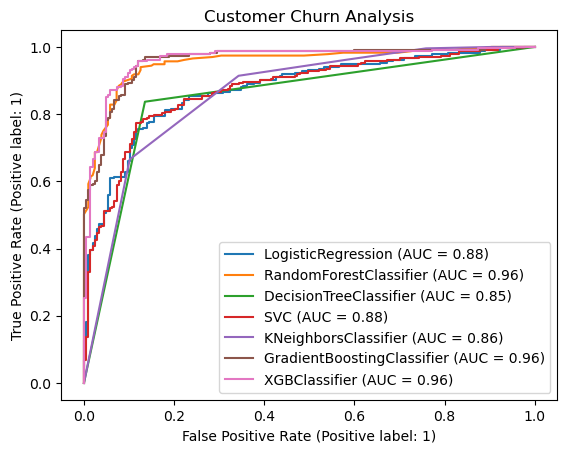

In [221]:
#Lets plot roc curve and check auc and performance of all algorithms
disp = plot_roc_curve(lr, x_test, y_test)
plot_roc_curve(rfc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(dtc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(knn, x_test, y_test, ax = disp.ax_)
plot_roc_curve(gb, x_test, y_test, ax = disp.ax_)
plot_roc_curve(XGBC, x_test, y_test, ax = disp.ax_)
plt.title("Customer Churn Analysis")
plt.legend(prop={"size" :10} ,loc = 'lower right')
plt.show()

#### Observations:

From the observation of accuracy and cross validation score and their difference we can predict that XGB Classifier is the best model.

### Hyper parameter tuning for best model using GridsearchCV

In [222]:
params = {
    'n_estimators': [100, 200, 500],
    'learning_rate': [0.01,0.05,0.1],
    'booster': ['gbtree', 'gblinear'],
    'gamma': [0, 0.5, 1],
    'reg_alpha': [0, 0.5, 1],
    'reg_lambda': [0.5, 1, 5],
    'base_score': [0.2, 0.5, 1]
}

In [223]:
from sklearn.model_selection import KFold

In [224]:
CV_XGB = GridSearchCV(XGBClassifier(n_jobs=-1), params, n_jobs=-1, cv=KFold(n_splits=3), scoring='roc_auc')

In [225]:
CV_XGB.fit(x_train, y_train)

GridSearchCV(cv=KFold(n_splits=3, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=-1,
                                     num_parallel_tree=None, predictor=None,
                        

In [226]:
print('Best score:', CV_XGB.best_score_)
print('Best score:', CV_XGB.best_params_)

Best score: 0.9407350533368778
Best score: {'base_score': 0.2, 'booster': 'gbtree', 'gamma': 0, 'learning_rate': 0.1, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 1}


In [227]:
Insurance_Fraud_Detection = XGBClassifier()
Insurance_Fraud_Detection.fit(x_train, y_train)
pred = Insurance_Fraud_Detection.predict(x_test)
print("accuracy score: ",accuracy_score(y_test,pred))
print("confusion_matrix: \n",confusion_matrix(y_test,pred))
print("classification_report: \n",classification_report(y_test,pred))

accuracy score:  0.9159090909090909
confusion_matrix: 
 [[186  21]
 [ 16 217]]
classification_report: 
               precision    recall  f1-score   support

           0       0.92      0.90      0.91       207
           1       0.91      0.93      0.92       233

    accuracy                           0.92       440
   macro avg       0.92      0.91      0.92       440
weighted avg       0.92      0.92      0.92       440



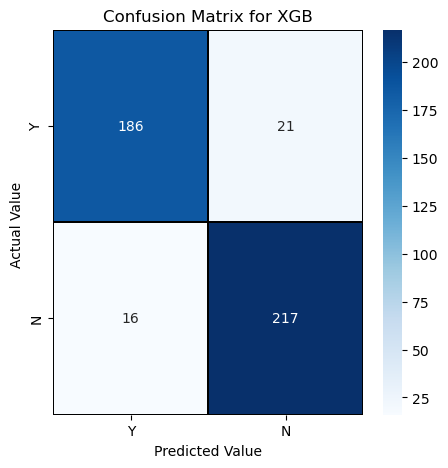

In [228]:
cm = confusion_matrix(y_test, pred)

x_axis_labels = ["Y","N"]
y_axis_labels = ["Y","N"]

f, ax = plt.subplots(figsize =(5,5))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="Blues", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("Predicted Value")
plt.ylabel("Actual Value ")
plt.title('Confusion Matrix for XGB')
plt.show()

Here the final model gives 90% accuracy after tuning.

### ROC-AUC Curve

In [229]:
fpr, tpr, threshold = roc_curve(y_test,pred)
auc = roc_auc_score(y_test,pred)

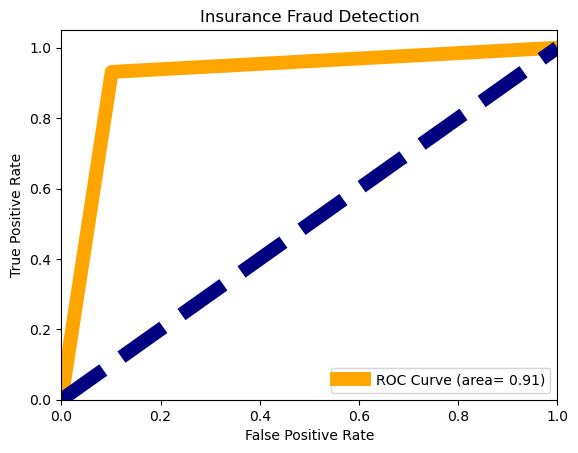

In [230]:
plt.figure()
plt.plot(fpr,tpr,color="orange",lw=10,label="ROC Curve (area= %0.2f)" % auc)
plt.plot([0,1],[0,1],color="navy",lw=10,linestyle="--")
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Insurance Fraud Detection")
plt.legend(loc="lower right")
plt.show()

#### This is the AUC-ROC curve for the models which is plotted False positive rate against True positive rate. So the best model has the area under curve as 0.90.

### Saving the Model

In [231]:
import pickle
filename='Insurance_Fraud_Detection.pickle'
pickle.dump(CV_XGB,open(filename,'wb'))
loaded_model = pickle.load(open(filename, 'rb'))
loaded_model.predict(x_test)

array([1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1,

### Checking predicted and original values

In [232]:
a =np.array(y_test)
predicted=np.array(CV_XGB.predict(x_test))
Insurance_Fraud_Detection=pd.DataFrame({'Orginal':a,'Predicted':predicted}, index=range(len(a)))
Insurance_Fraud_Detection

,Orginal,Predicted
0,1,1
1,1,1
2,0,0
3,0,0
4,0,0
...,...,...
435,1,1
436,1,1
437,0,1
438,1,1


#### As we can see, predicted and original values matches approx 100%.

In [233]:
model =Insurance_Fraud_Detection.to_csv('Insurance_Fraud_Detection.csv')
model

#### Model Prediction saved in CSV format